# Main Focus of the Notebook: Plotting the filtered Tracks with different Lifetime Cohorts and Cummulative Plots
## Divided into three sections 
1. Dynamin and Clathrin positive 
2. Actin and Clathrin positive 
3. Actin, Dynamin and Clathrin positive

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys 
import os
sys.path.append('../src/')
from intensity_time_plots import filter_track_ids_by_length_ranges, random_track_ids
from intensity_time_plots import intensity_time_plot, createBufferForLifetimeCohort
from intensity_time_plots import createBufferForLifetimeCohort_normalized, cumulative_plots

In [2]:
###### Set the following variables #######


# Background intensity for each channel

background_channel_1 = 240
background_channel_2 = 150
background_channel_3 = 170

# framerate (in milliseconds)

framerate_msec = 2300


In [3]:
# This assumes that your notebook is inside 'Jupyter Notebooks', which is at the same level as 'test_data'
base_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), '..', 'movie_data')

zarr_directory = 'zarr_file/all_channels_data'
zarr_full_path = os.path.join(base_dir, zarr_directory)

input_directory = 'datasets'
input_file_name = 'track_df_cleaned_final_full.pkl'
input_directory_all_tracks_full = os.path.join(base_dir,input_directory, input_file_name)

input_file_name = 'filtered_tracks_final.pkl'
input_directory_full_filtered_tracks = os.path.join(base_dir,input_directory , input_file_name)

In [4]:
track_df = pd.read_pickle(input_directory_all_tracks_full)
filtered_tracks = pd.read_pickle(input_directory_full_filtered_tracks)

In [5]:
track_df.columns

Index(['frame', 'index', 'c3_gaussian_amp', 'c3_mu_x', 'c3_mu_y', 'c3_mu_z',
       'c3_sigma_x', 'c3_sigma_y', 'c3_sigma_z', 'errors', 'frame_y',
       'mean_errors_mu', 'mean_errors_sigma', 'tree_id', 'track_id',
       'number_of_frames', 'color', 'c3_mean_amp', 'c3_voxel_sum',
       'c3_voxel_sum_adjusted', 'c3_peak_amp', 'c3_peak_x', 'c3_peak_y',
       'c3_peak_z', 'c2_amp', 'c2_peak_amp', 'c2_peak_x', 'c2_peak_y',
       'c2_peak_z', 'c2_peak_mean', 'c2_voxel_sum', 'c2_voxel_sum_adjusted',
       'c2_gaussian_amp', 'c2_mu_x', 'c2_mu_y', 'c2_mu_z', 'c2_sigma_x',
       'c2_sigma_y', 'c2_sigma_z', 'c1_amp', 'c1_peak_amp', 'c1_peak_x',
       'c1_peak_y', 'c1_peak_z', 'c1_voxel_sum', 'c1_voxel_sum_adjusted',
       'c1_gaussian_amp', 'c1_mu_x', 'c1_mu_y', 'c1_mu_z', 'c1_sigma_x',
       'c1_sigma_y', 'c1_sigma_z'],
      dtype='object')

In [6]:
# Define cohort sizes
# range of track lengths to plot in each cohort, in frames
custom_length_ranges = [[5, 10], [11,15], [16, 20], [21, 25], [26, 30], [31, 40], [41,90]]

Category 3: Positive for all three channels

In [7]:
cat3_df = filtered_tracks[(filtered_tracks['channel2_positive'] == True) & (filtered_tracks['channel1_positive'] == True)]
cat3_df.shape

(104, 24)

# Category 3 
## Actin, Dynamin and Clathrin positive

In [8]:
track_id_arrays = filter_track_ids_by_length_ranges(dataframe = cat3_df, track_length_buckets = custom_length_ranges, 
                                 track_id_col_name = 'track_id', track_length_col_name = 'track_length')

print(f'number of tracks between [5,10] frames long are {len(track_id_arrays[0])}')
print(f'number of tracks between [11,15] frames long are {len(track_id_arrays[1])}')
print(f'number of tracks between [16,20] frames long are {len(track_id_arrays[2])}')
print(f'number of tracks between [21,25] frames long are {len(track_id_arrays[3])}')
print(f'number of tracks between [26,30] frames long are {len(track_id_arrays[4])}')
print(f'number of tracks between [31,40] frames long are {len(track_id_arrays[5])}')
print(f'number of tracks between [41,90] frames long are {len(track_id_arrays[6])}')

number of tracks between [5,10] frames long are 11
number of tracks between [11,15] frames long are 21
number of tracks between [16,20] frames long are 26
number of tracks between [21,25] frames long are 20
number of tracks between [26,30] frames long are 5
number of tracks between [31,40] frames long are 15
number of tracks between [41,90] frames long are 5


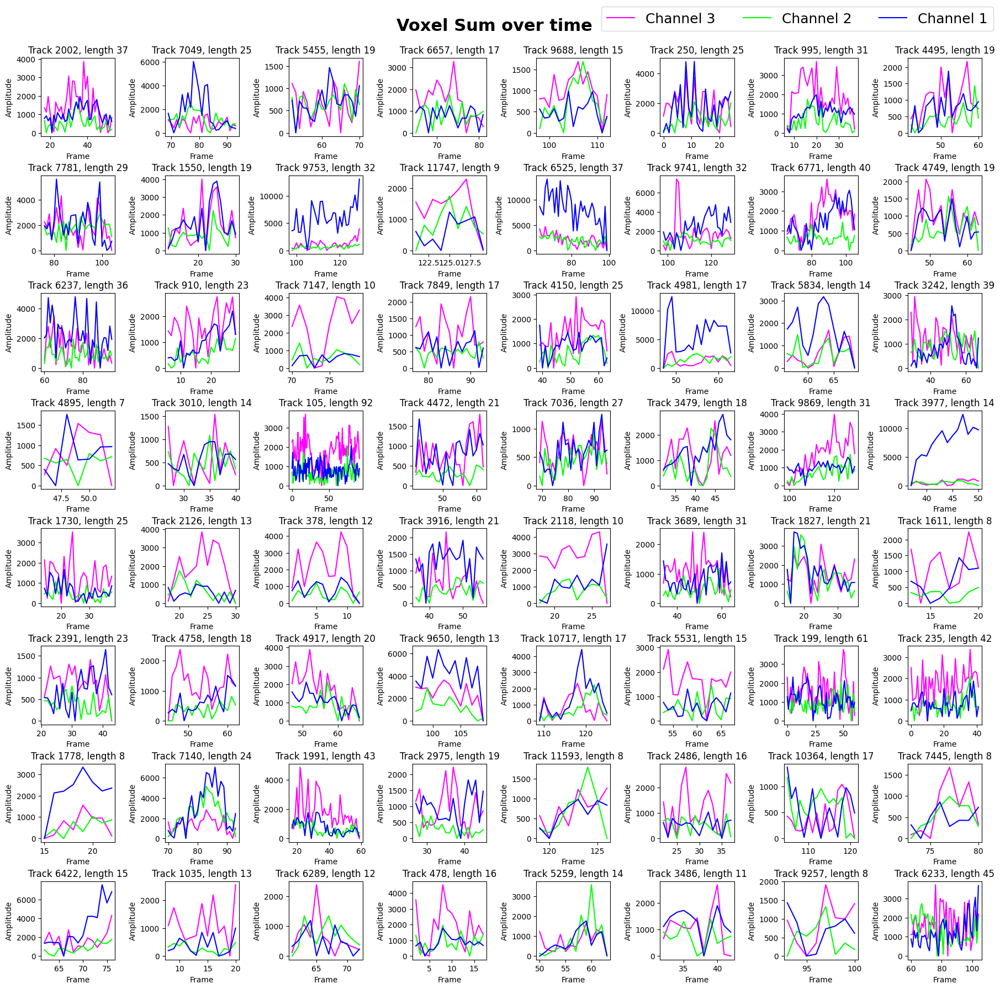

In [9]:
# Plot random tracks
random_tracks = random_track_ids(dataframe = cat3_df, desired_length = [0, np.inf], 
                                 track_length_col_name = 'track_length', track_id_col_name = 'track_id', 
                                num_to_select = 64)

intensity_time_plot(dataframe = track_df, tracks_to_plot = random_tracks, 
intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id', 
frame_col_name = 'frame', channels_to_plot = 3, legend_values = ['Channel 3', 'Channel 2', 'Channel 1'],
line_colors = ['magenta', 'lime', 'blue'], graph_title = 'Voxel Sum')

In [10]:
# Uncomment to plot tracks from a specific lifetime cohort
# ## Pick which lifetime cohort to plot from, between 0 (shortest tracks) to 6 (longest tracks)

# cohort_to_plot = 3

# print("plotting tracks between " + str(custom_length_ranges[3][0]) + " and " + str(custom_length_ranges[3][1]) + " frames long")

# ### Select random track ids of a desired length 

# random_tracks = random_track_ids(dataframe = cat3_df, desired_length = custom_length_ranges[cohort_to_plot], 
#                                  track_length_col_name = 'track_length', track_id_col_name = 'track_id', 
#                                 num_to_select = 64)

# ### The amplitude used for plotting is voxel sum from both channels. Minimum voxel sum is subtracted from all values to try and bring starting intensities close to zero

# intensity_time_plot(dataframe = track_df, tracks_to_plot = random_tracks, 
# intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id', 
# frame_col_name = 'frame', channels_to_plot = 3, legend_values = ['Channel 3', 'Channel 2', 'Channel 1'],
# line_colors = ['magenta', 'lime', 'blue'], graph_title = 'Voxel Sum')

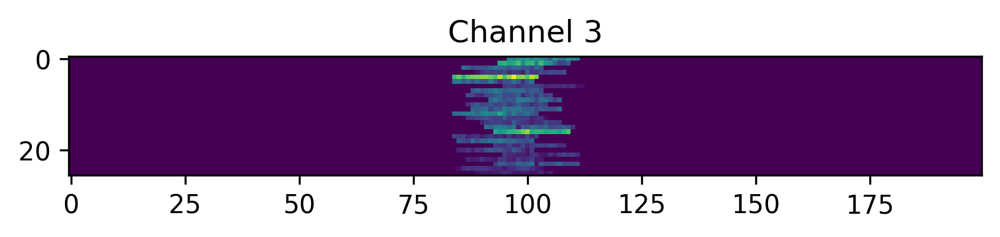

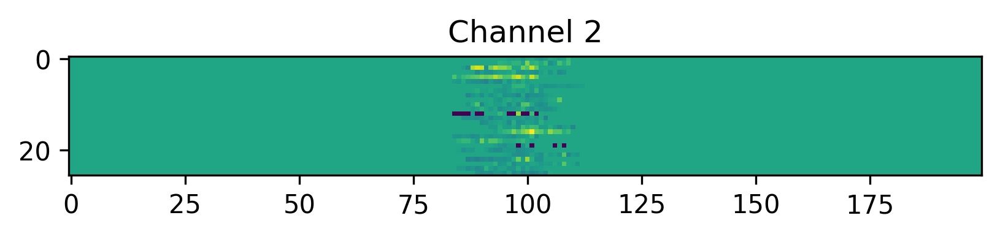

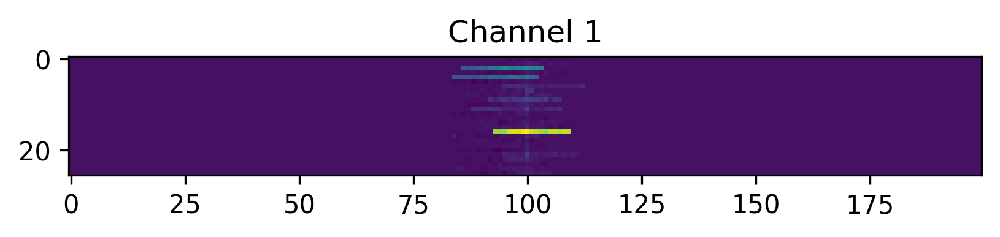

In [10]:
primary_buffer, secondary_buffer, tertiary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[2], backgroundIntensity = [background_channel_3, background_channel_2, background_channel_1], 
intensity_to_plot = ['c3_gaussian_amp','c2_gaussian_amp', 'c1_gaussian_amp'], track_id_col_name = 'track_id')

# visualize alignment of tracks

plt.figure(dpi=300)
plt.title('Channel 3')
plt.imshow(primary_buffer)

plt.figure(dpi=300)
plt.title('Channel 2')
plt.imshow(secondary_buffer)

plt.figure(dpi=300)
plt.title('Channel 1')
plt.imshow(tertiary_buffer)


## Cohort Plots for 3 Channels(Clathrin, Dynamin and Actin)

/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:356: RuntimeWarning: Mean of empty slice
  p_buffer_average = np.nanmean(p_buffer - np.nanmin(p_buffer, axis=1, keepdims=True), axis=0)
/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:357: RuntimeWarning: Mean of empty slice
  s_buffer_average = np.nanmean(s_buffer - np.nanmin(s_buffer, axis=1, keepdims=True), axis=0)
/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:358: RuntimeWarning: Mean of empty slice
  t_buffer_average = np.nanmean(t_buffer - np.nanmin(t_buffer, axis=1, keepdims=True), axis=0)
/Users/makamats/opt/anaconda3/envs/cme_pipeline/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


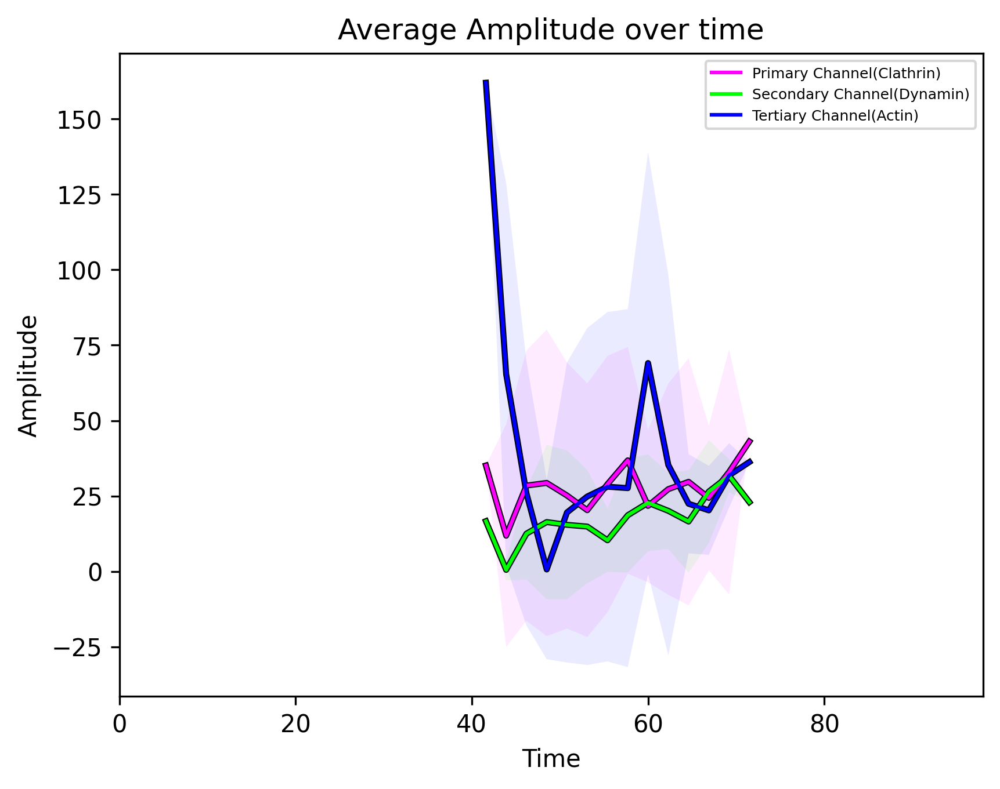

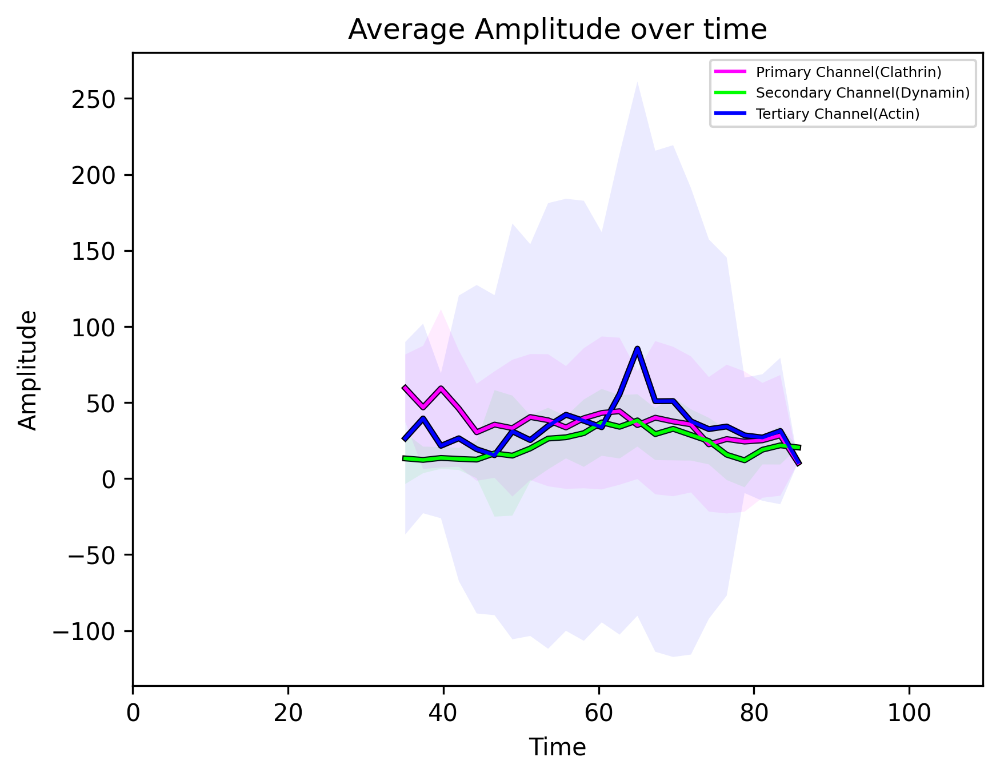

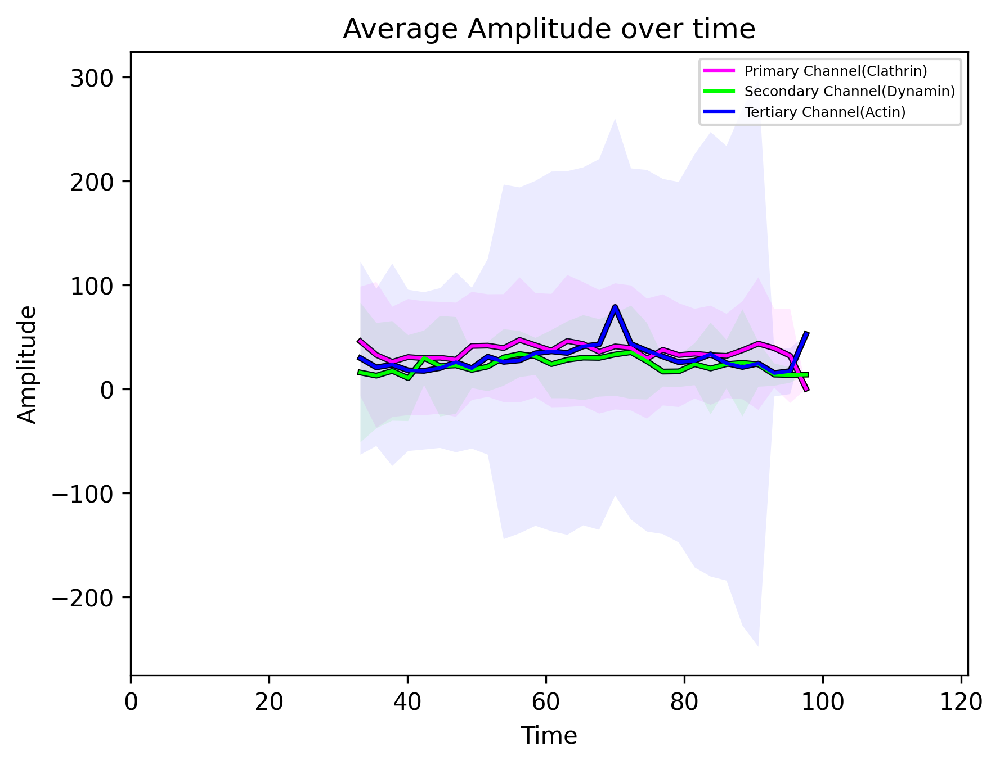

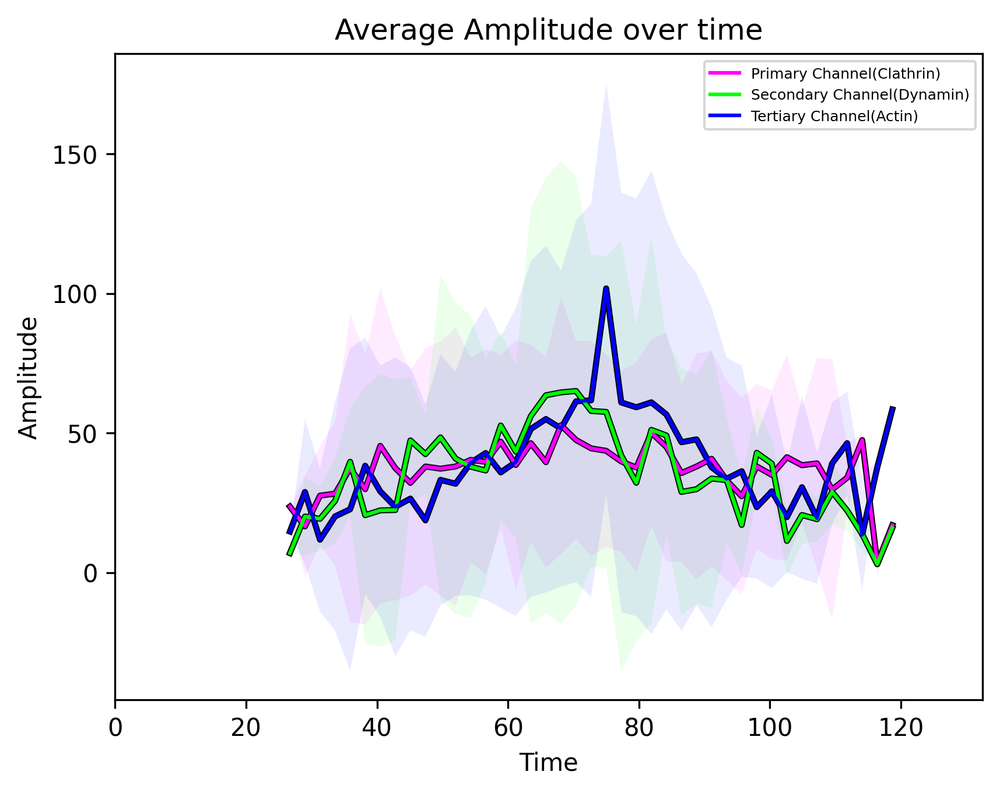

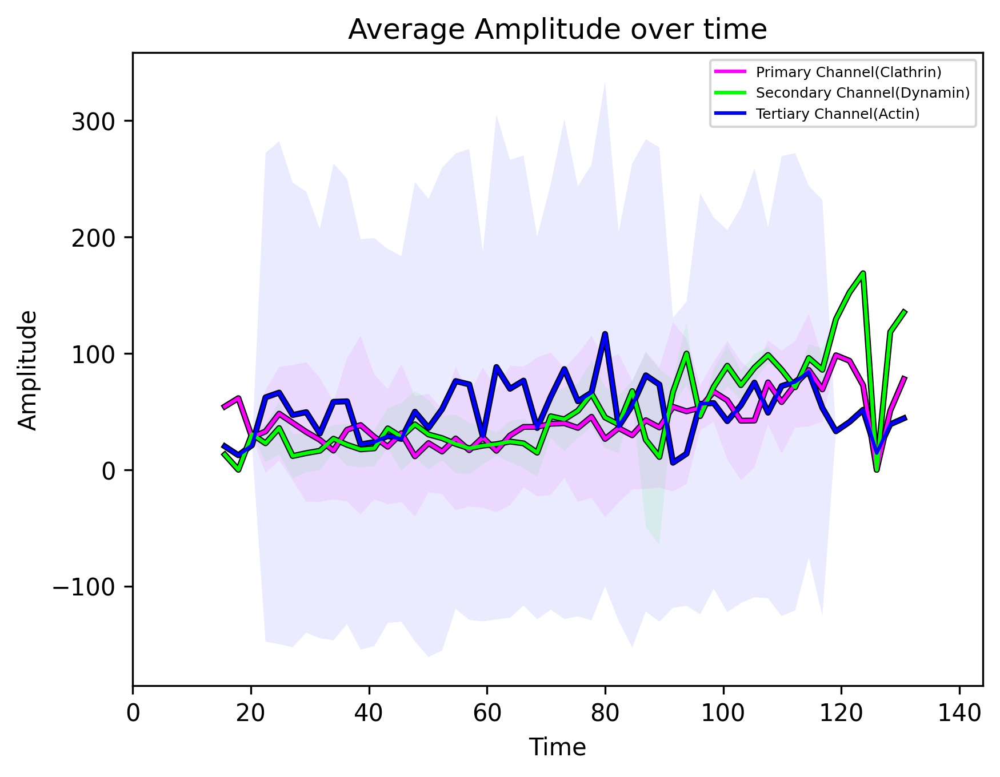

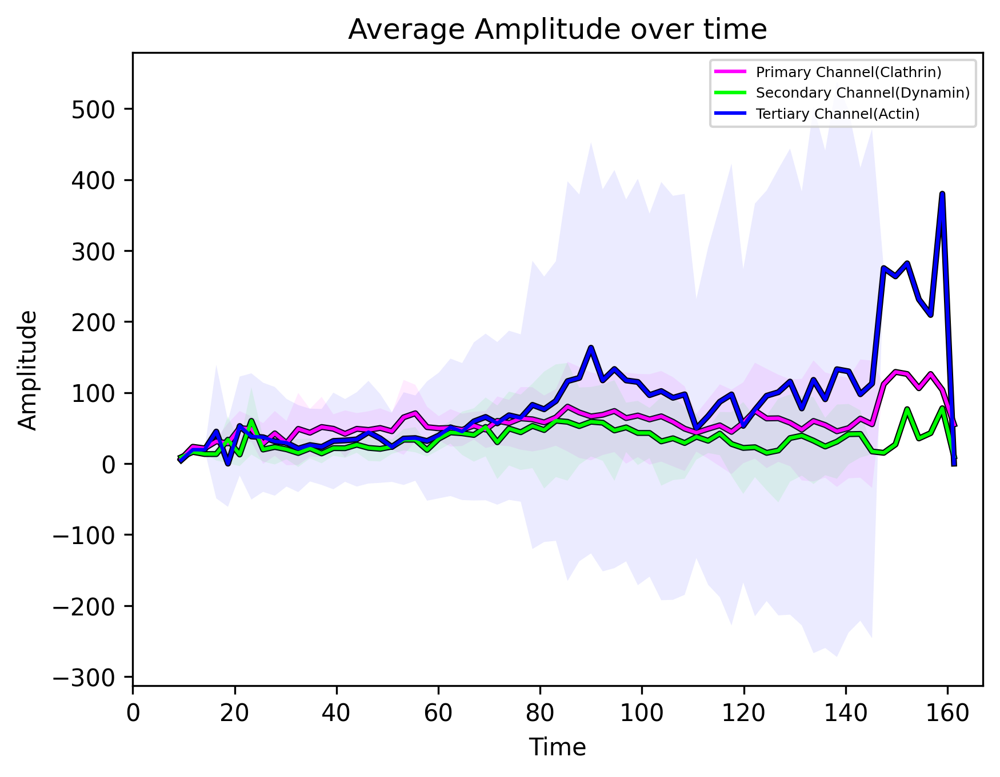

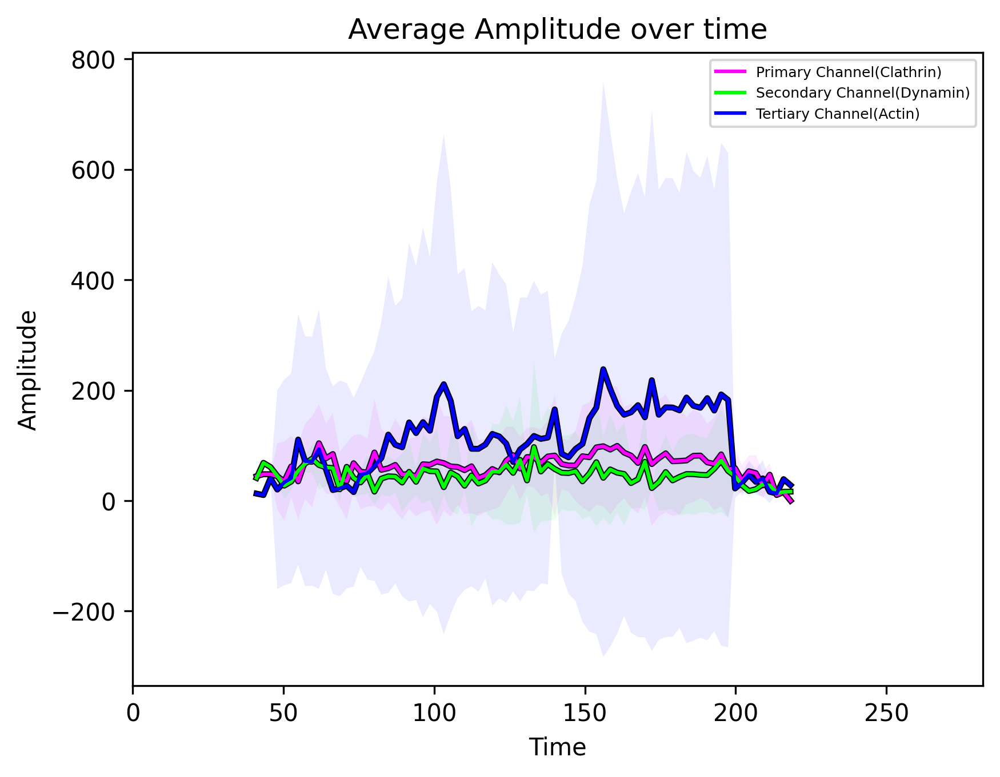

In [12]:
for n, cohort in enumerate(custom_length_ranges):
    primary_buffer, secondary_buffer, tertiary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
    listOfTrackIdsAssignedToCohort = track_id_arrays[n], backgroundIntensity = [background_channel_1, background_channel_2, background_channel_3], 
    # intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id')
    intensity_to_plot = ['c3_gaussian_amp','c2_gaussian_amp', 'c1_gaussian_amp'], track_id_col_name = 'track_id')

    cumulative_plots(buffers = [primary_buffer, secondary_buffer, tertiary_buffer],
    background_intensity= [background_channel_1, background_channel_2, background_channel_3], time_shift = 50+cohort[1], framerate_msec = 2.3*1000, colors = ['magenta', 'lime', 'blue'], 
                    legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Dynamin)', 'Tertiary Channel(Actin)'])
    plt.xlim(0, 75+cohort[1]*framerate_msec/1000)


Normalized

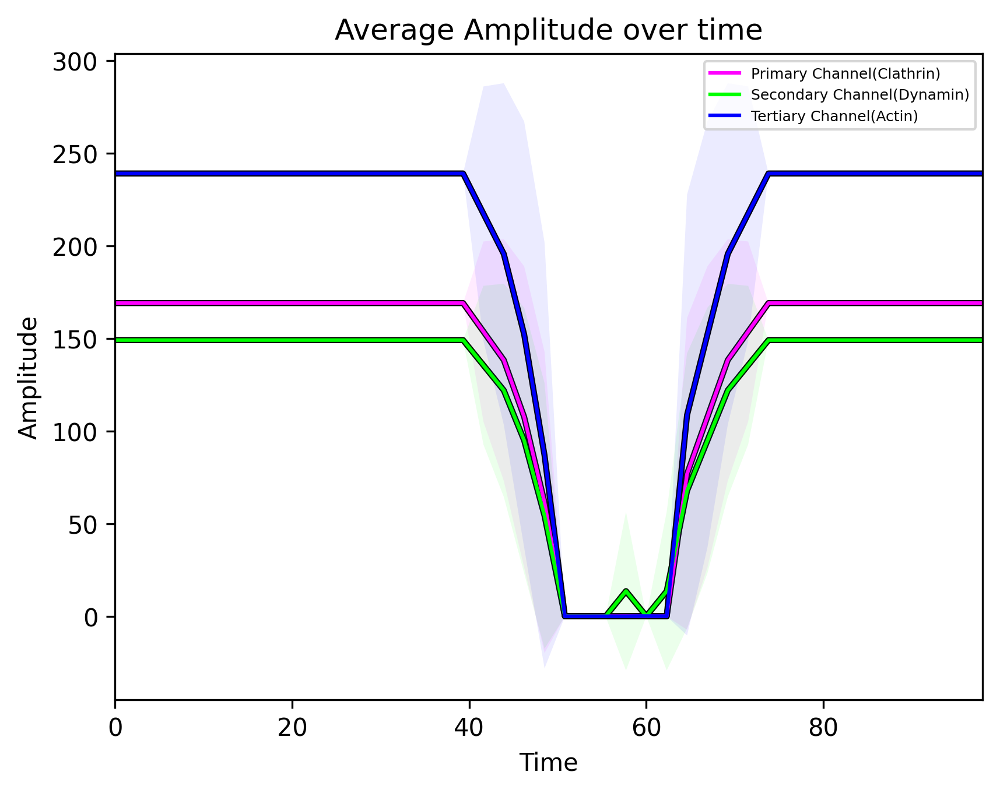

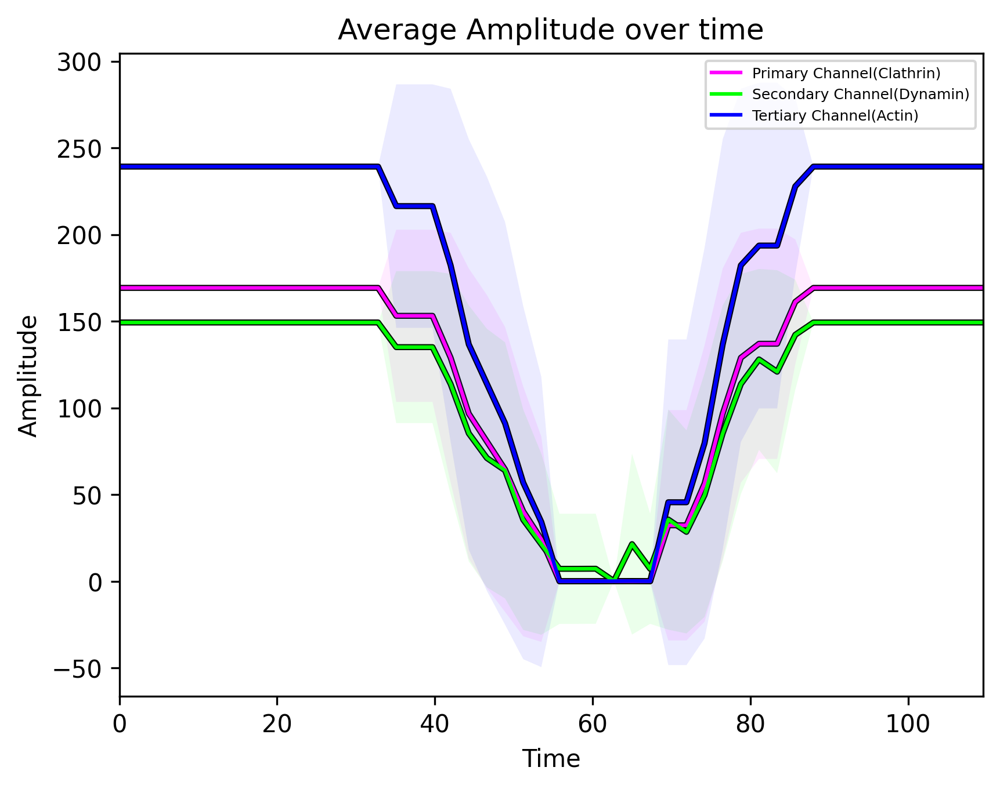

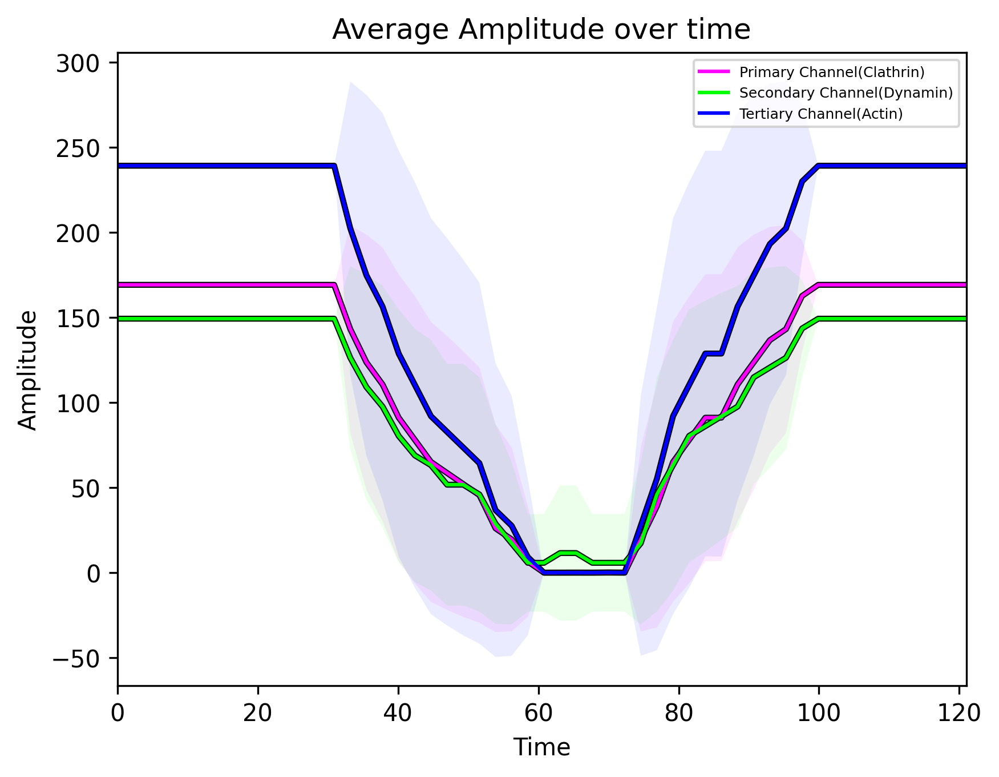

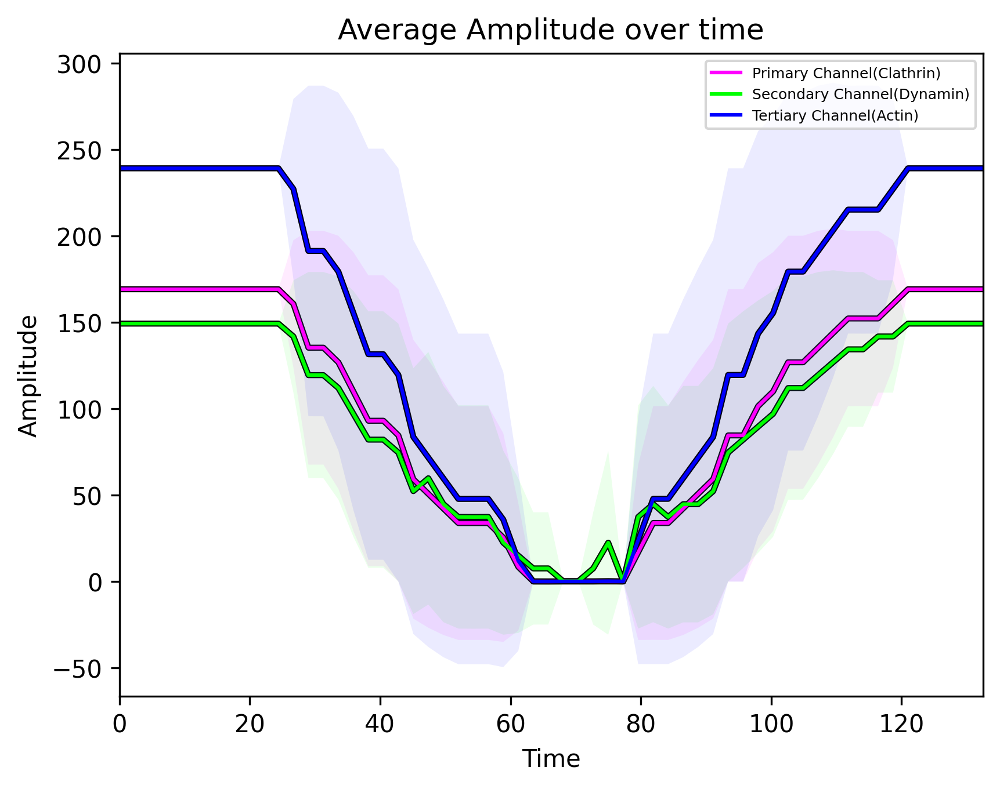

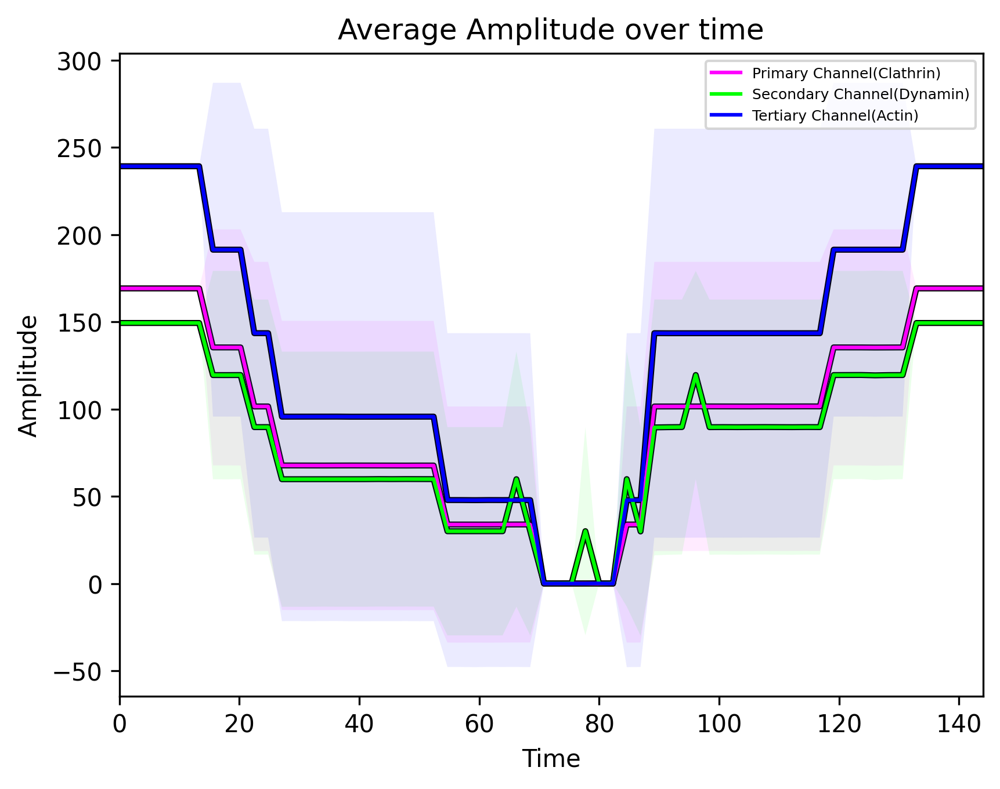

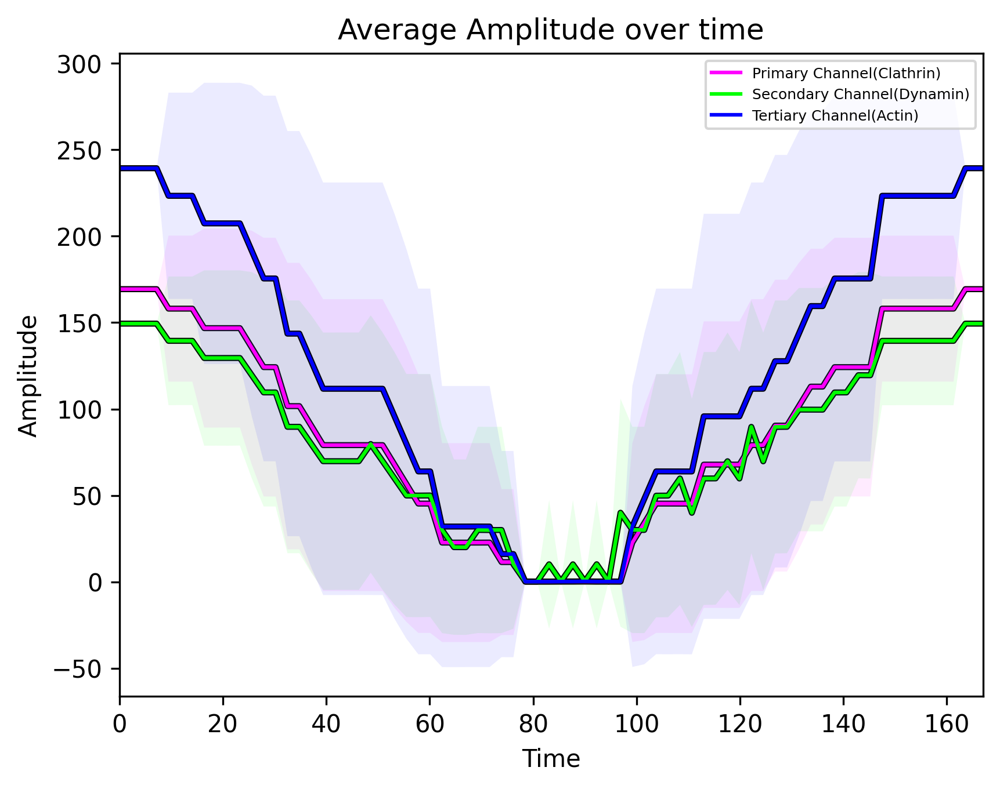

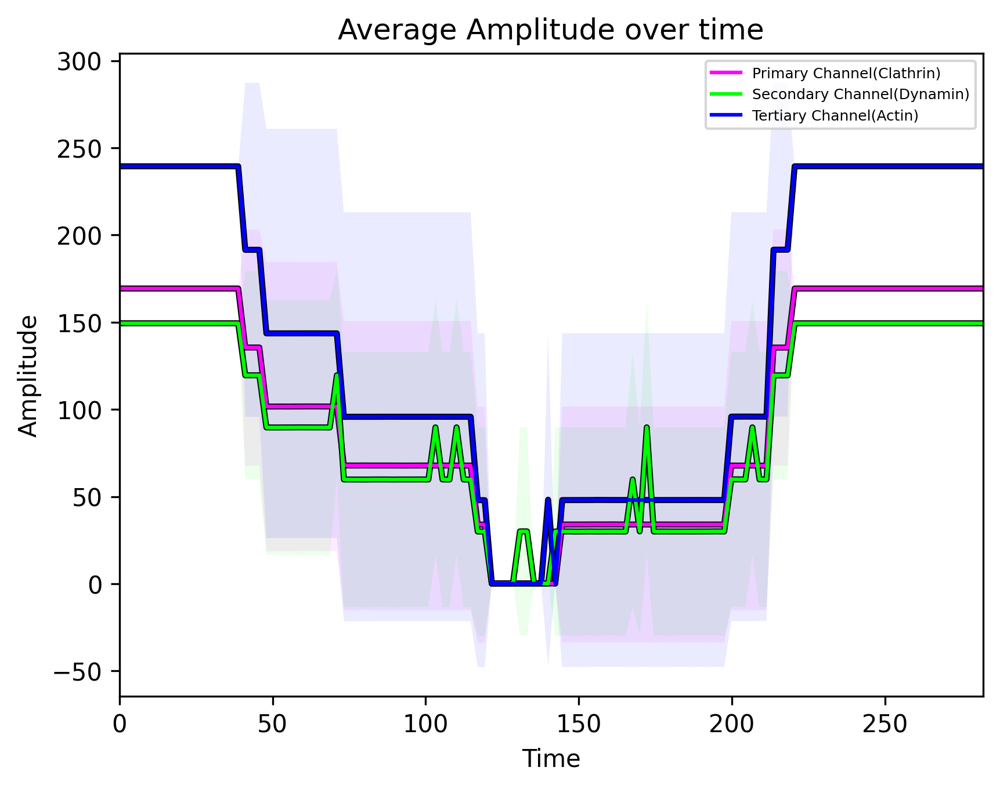

In [15]:
for n, cohort in enumerate(custom_length_ranges):
    primary_buffer, secondary_buffer, tertiary_buffer = createBufferForLifetimeCohort_normalized(dataframe = track_df ,
    listOfTrackIdsAssignedToCohort = track_id_arrays[n], backgroundIntensity = [background_channel_3, background_channel_2, background_channel_1], 
    # intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id')
    intensity_to_plot = ['c3_gaussian_amp','c2_gaussian_amp', 'c1_gaussian_amp'], track_id_col_name = 'track_id')

    cumulative_plots(buffers = [primary_buffer, secondary_buffer, tertiary_buffer],
    background_intensity= [background_channel_3, background_channel_2, background_channel_1], time_shift = 50+cohort[1], framerate_msec = 2.3*1000, colors = ['magenta', 'lime', 'blue'], 
                    legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Dynamin)', 'Tertiary Channel(Actin)'])
    plt.xlim(0, 75+cohort[1]*framerate_msec/1000)


For different surfaces

In [115]:
cat3_df_apical = cat3_df[cat3_df['membrane_region'] == 'Apical']
cat3_df_basal = cat3_df[cat3_df['membrane_region'] == 'Basal']
cat3_df_lateral = cat3_df[cat3_df['membrane_region'] == 'Lateral']


Set "cat3_df_region" to one of the three above variables

In [130]:
cat3_df_region = cat3_df_apical

region = cat3_df_region['membrane_region'].values[0]

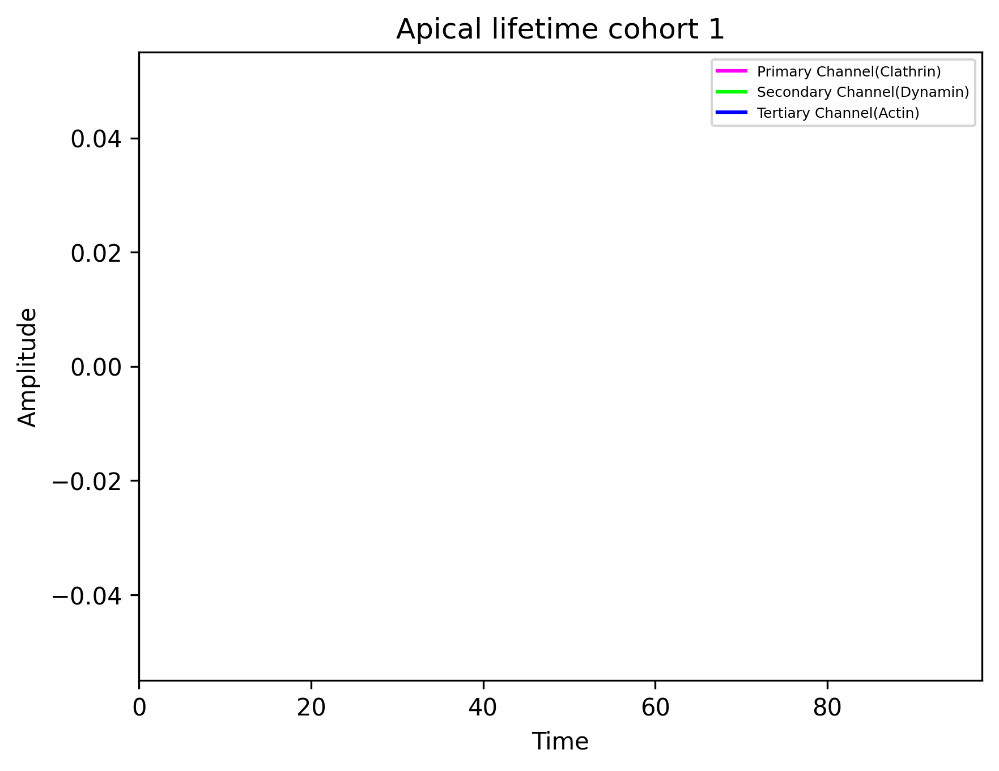

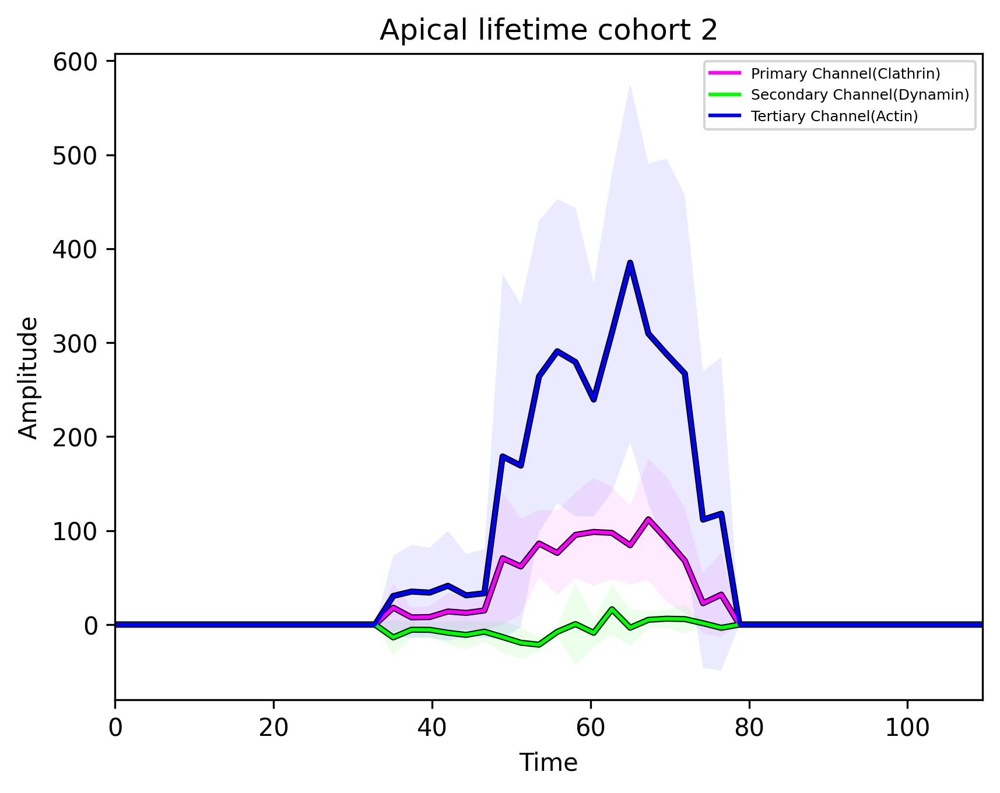

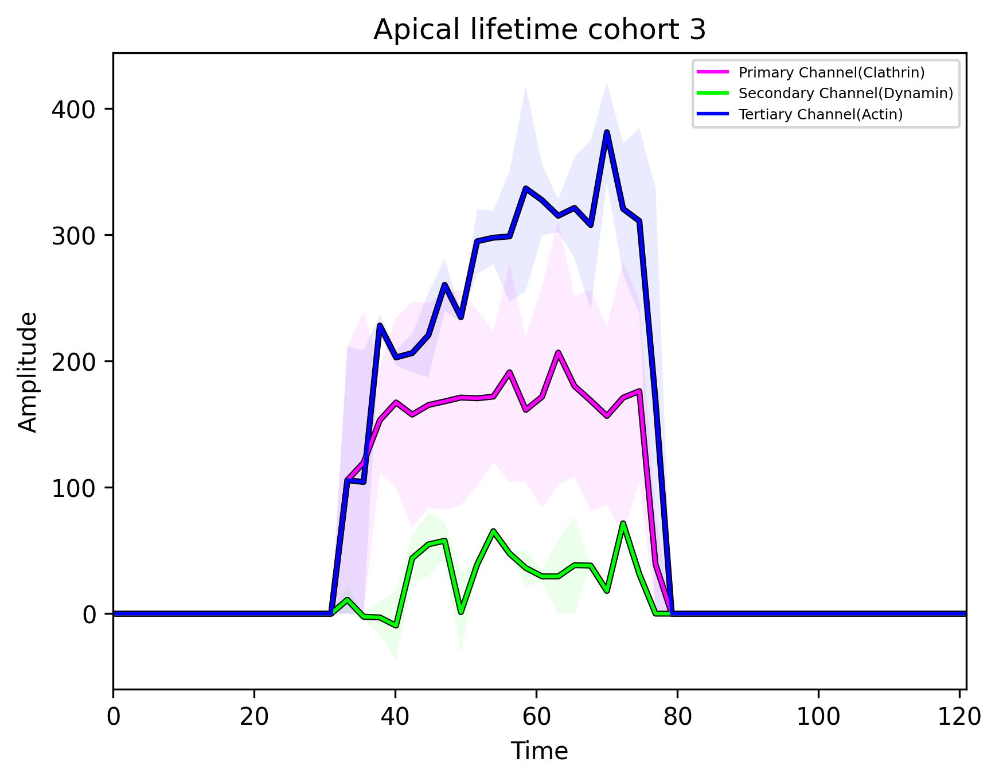

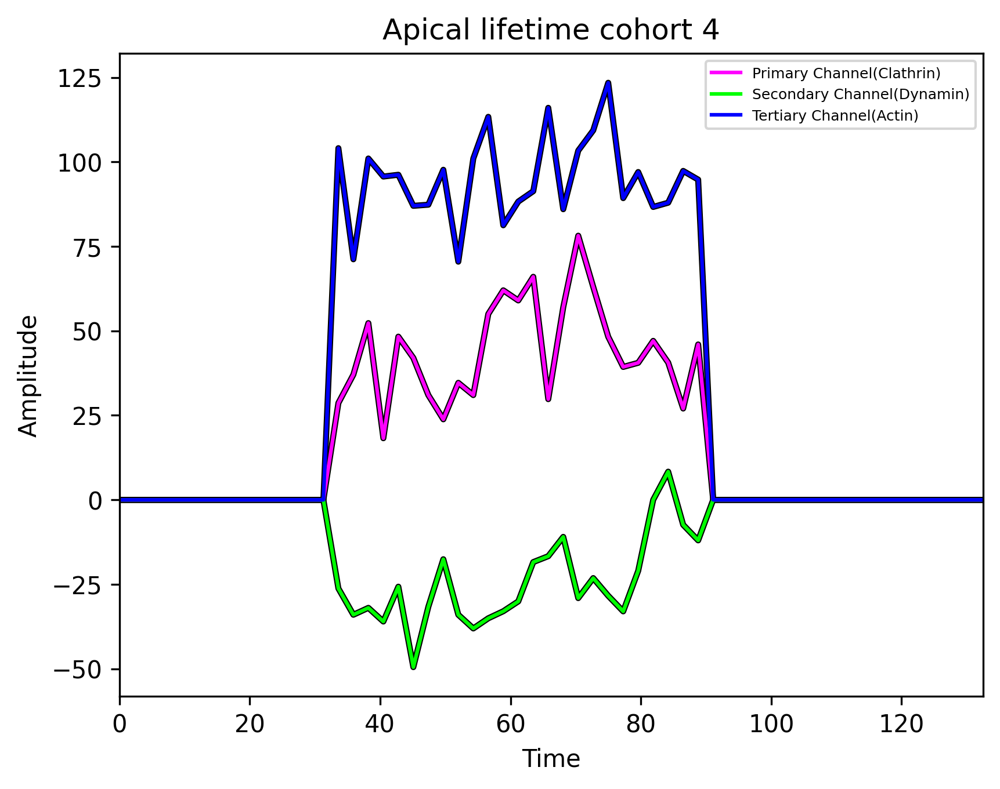

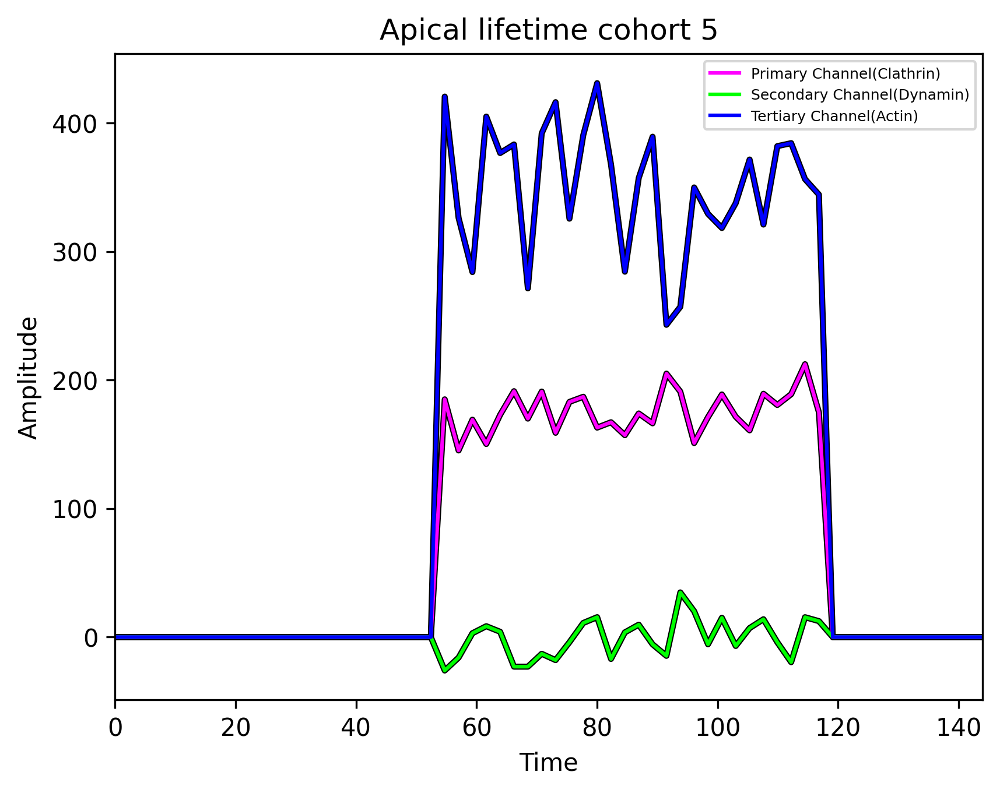

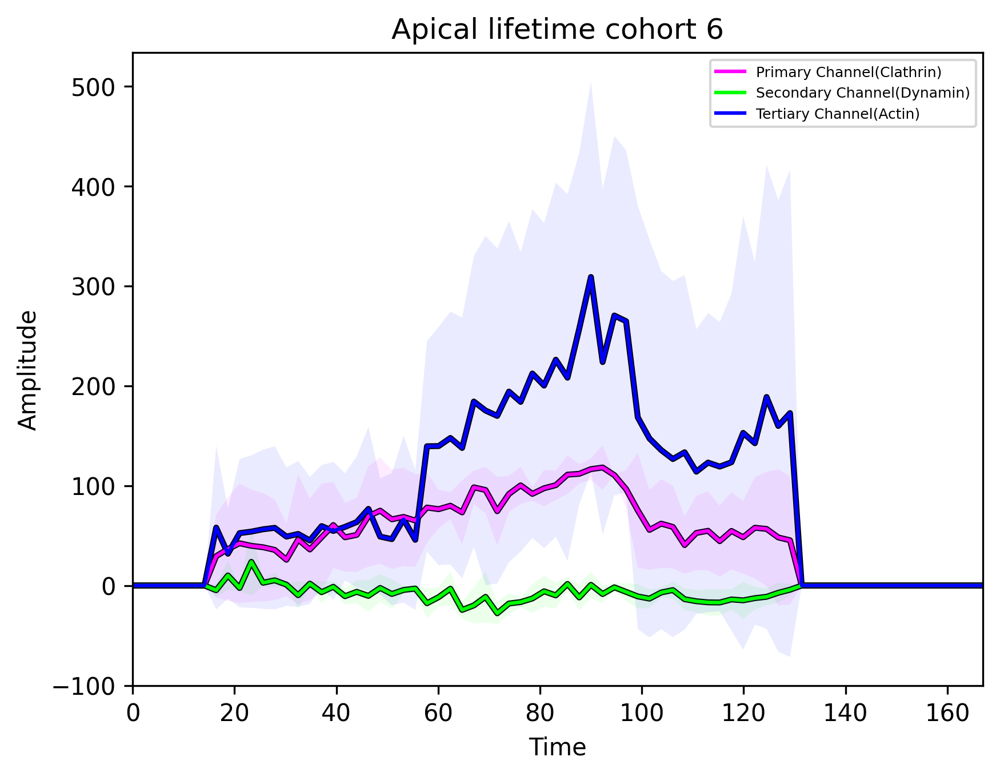

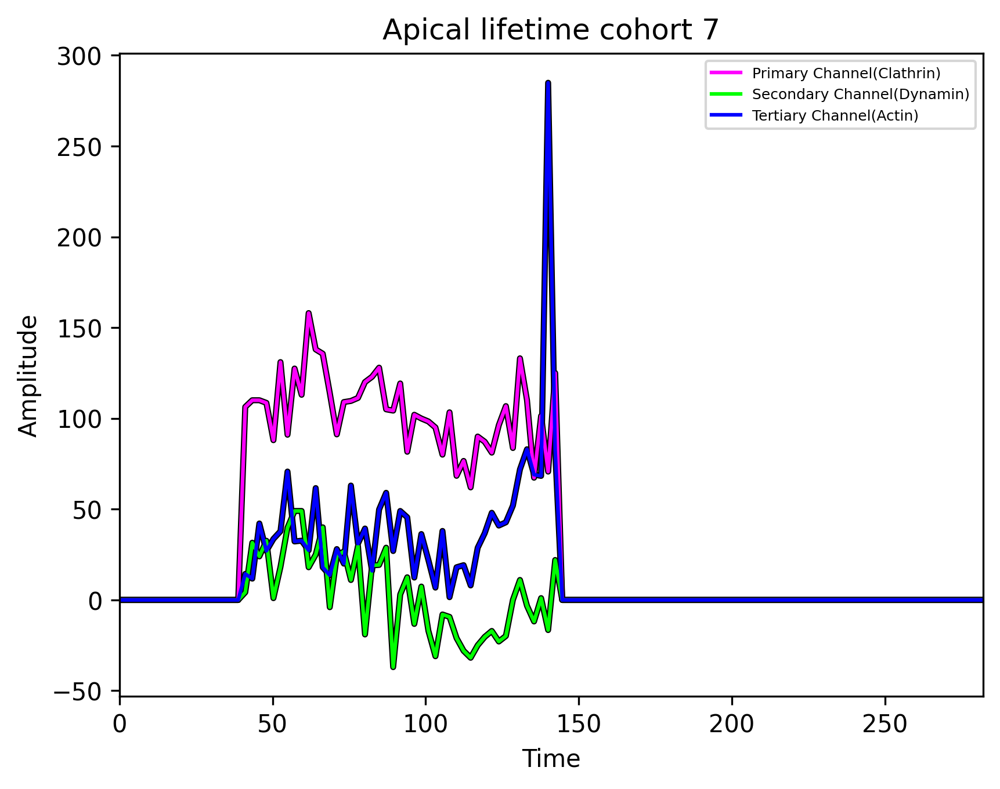

In [134]:
# plot cohorts for the region

track_id_arrays = filter_track_ids_by_length_ranges(dataframe = cat3_df_region, track_length_buckets = custom_length_ranges, 
                                 track_id_col_name = 'track_id', track_length_col_name = 'track_length')


for n, cohort in enumerate(custom_length_ranges):
    primary_buffer, secondary_buffer, tertiary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
    listOfTrackIdsAssignedToCohort = track_id_arrays[n], backgroundIntensity = [170,160,240], 
    # intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id')
    intensity_to_plot = ['c3_gaussian_amp','c2_gaussian_amp', 'c1_gaussian_amp'], track_id_col_name = 'track_id')

    cumulative_plots(buffers = [primary_buffer, secondary_buffer, tertiary_buffer],
    background_intensity= [170,160,240], time_shift = 50+cohort[1], framerate_msec = 2.3*1000, colors = ['magenta', 'lime', 'blue'], 
                    legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Dynamin)', 'Tertiary Channel(Actin)'])
    plt.xlim(0, 75+cohort[1]*framerate_msec/1000)
    plt.title(region+' lifetime cohort '+str(n+1))


## Dynamin and Clathrin Positive 

In [18]:
cat1_df = filtered_tracks[filtered_tracks['channel2_positive'] == True]
track_id_arrays = filter_track_ids_by_length_ranges(dataframe = cat1_df, track_length_buckets = custom_length_ranges, 
                                 track_id_col_name = 'track_id', track_length_col_name = 'track_length')
print(f'number of tracks between [5,10] frames long are {len(track_id_arrays[0])}')
print(f'number of tracks between [11,15] frames long are {len(track_id_arrays[1])}')
print(f'number of tracks between [16,20] frames long are {len(track_id_arrays[2])}')
print(f'number of tracks between [21,25] frames long are {len(track_id_arrays[3])}')
print(f'number of tracks between [26,30] frames long are {len(track_id_arrays[4])}')
print(f'number of tracks between [31,40] frames long are {len(track_id_arrays[5])}')
print(f'number of tracks between [41,90] frames long are {len(track_id_arrays[6])}')

number of tracks between [5,10] frames long are 29
number of tracks between [11,15] frames long are 43
number of tracks between [16,20] frames long are 36
number of tracks between [21,25] frames long are 30
number of tracks between [26,30] frames long are 10
number of tracks between [31,40] frames long are 16
number of tracks between [41,90] frames long are 6


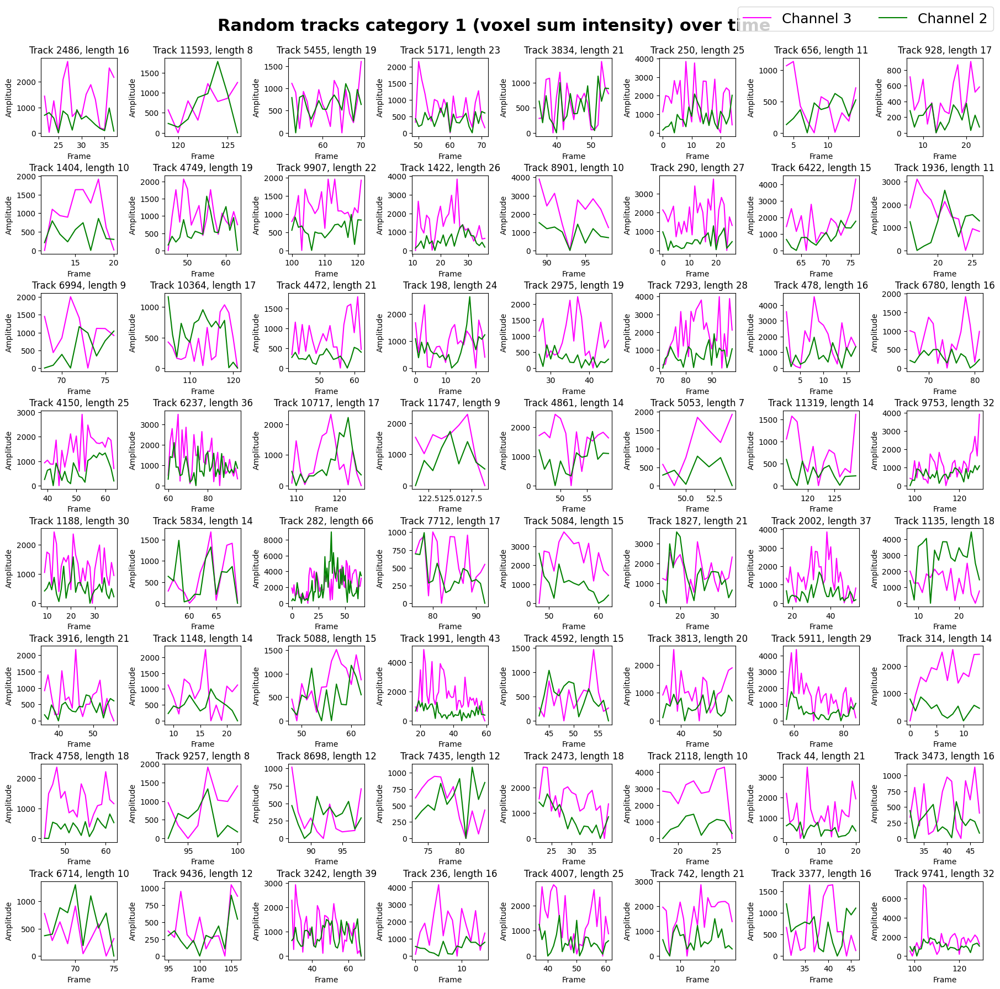

In [19]:
# Plot random tracks
random_tracks = random_track_ids(dataframe = cat1_df, desired_length = [0, np.inf], 
                                 track_length_col_name = 'track_length', track_id_col_name = 'track_id', 
                                num_to_select = 64)

intensity_time_plot(dataframe = track_df, tracks_to_plot = random_tracks, 
intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted'], track_id_col_name = 'track_id', 
frame_col_name = 'frame', channels_to_plot = 2, legend_values = ['Channel 3', 'Channel 2'],
line_colors = ['magenta', 'green'], graph_title = 'Random tracks category 1 (voxel sum intensity)')    

In [144]:
# Uncomment to plot tracks from a specific lifetime cohort
# ## Pick which lifetime cohort to plot from, between 0 (shortest tracks) to 6 (longest tracks)

# cohort_to_plot = 3

# print("plotting tracks between " + str(custom_length_ranges[3][0]) + " and " + str(custom_length_ranges[3][1]) + " frames long")

# ### Select random track ids of a desired length 

# random_tracks = random_track_ids(dataframe = cat1_df, desired_length = custom_length_ranges[cohort_to_plot], 
#                                  track_length_col_name = 'track_length', track_id_col_name = 'track_id', 
#                                 num_to_select = 64)

# ### The amplitude used for plotting is voxel sum from both channels. Minimum voxel sum is subtracted from all values to try and bring starting intensities close to zero

# intensity_time_plot(dataframe = track_df, tracks_to_plot = random_tracks, 
# intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted'], track_id_col_name = 'track_id', 
# frame_col_name = 'frame', channels_to_plot = 2, legend_values = ['Channel 3', 'Channel 2'],
# line_colors = ['red', 'green'], graph_title = 'Voxel Sum')

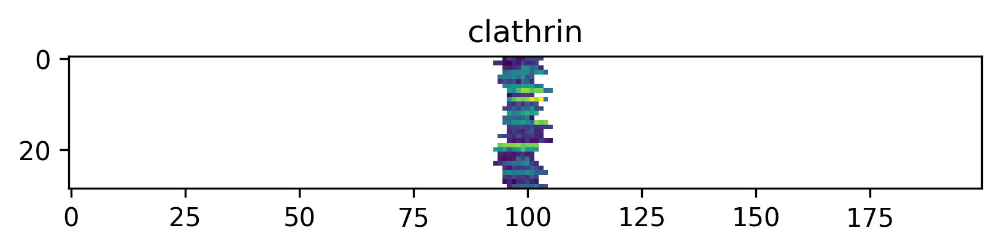

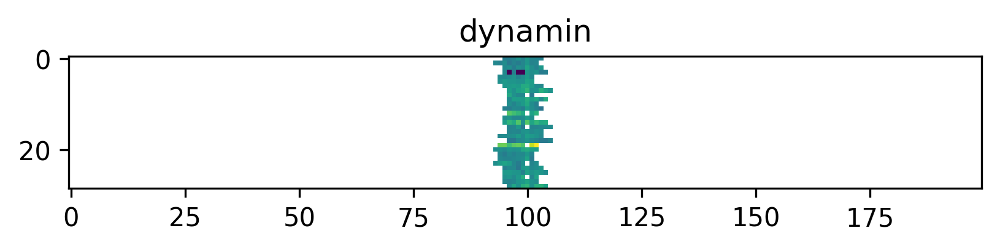

In [20]:

primary_buffer, secondary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[0], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c2_gaussian_amp'], track_id_col_name = 'track_id')
plt.figure(dpi=300)
plt.title('clathrin')
plt.imshow(primary_buffer)
plt.figure(dpi=300)
plt.title('dynamin')
plt.imshow(secondary_buffer)

# Plot by lifetime cohort

/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:329: RuntimeWarning: Mean of empty slice
  p_buffer_average = np.nanmean(p_buffer,axis=0)-np.min(np.nanmin(p_buffer,axis=0))
/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:329: RuntimeWarning: All-NaN slice encountered
  p_buffer_average = np.nanmean(p_buffer,axis=0)-np.min(np.nanmin(p_buffer,axis=0))
/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:330: RuntimeWarning: Mean of empty slice
  s_buffer_average = np.nanmean(s_buffer,axis=0)-np.min(np.nanmin(s_buffer,axis=0))
/Users/makamats/Repos/LLSM-CME-ANALYSIS/Final/Jupyter_Notebooks/../src/intensity_time_plots.py:330: RuntimeWarning: All-NaN slice encountered
  s_buffer_average = np.nanmean(s_buffer,axis=0)-np.min(np.nanmin(s_buffer,axis=0))
/Users/makamats/opt/anaconda3/envs/cme_pipeline/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1878:

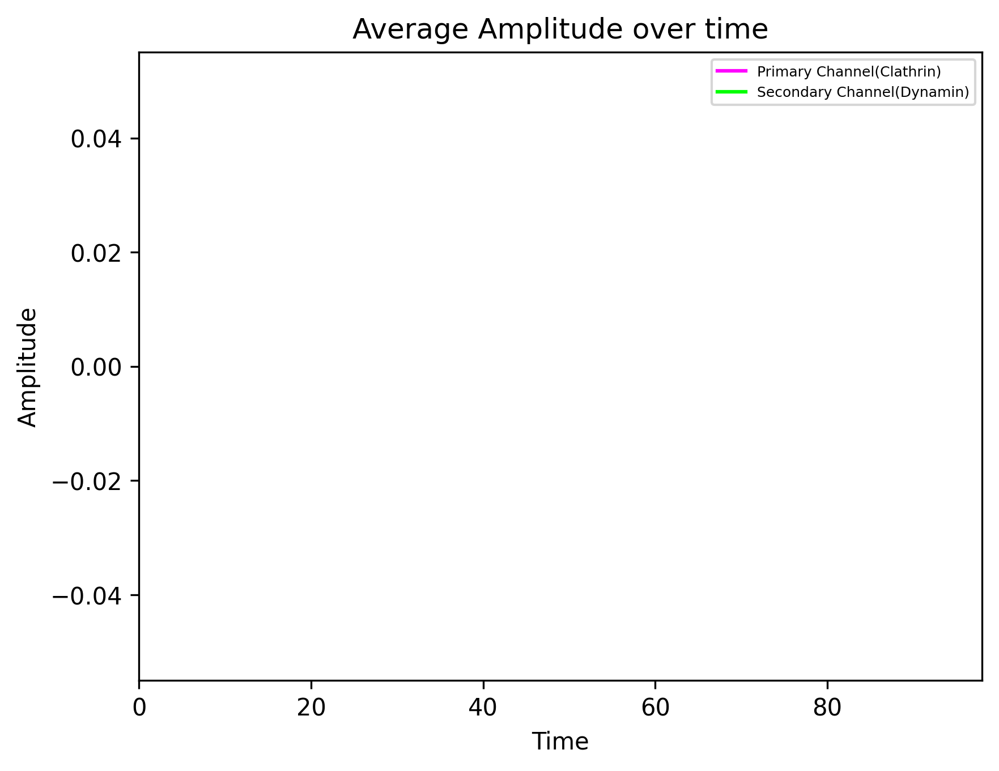

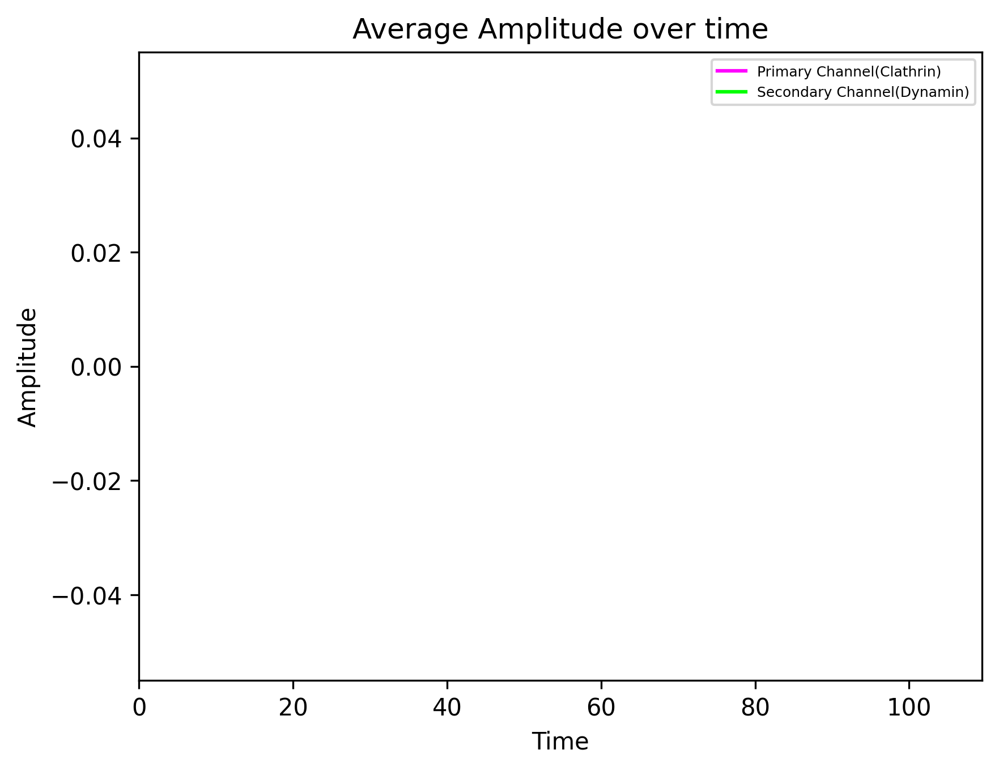

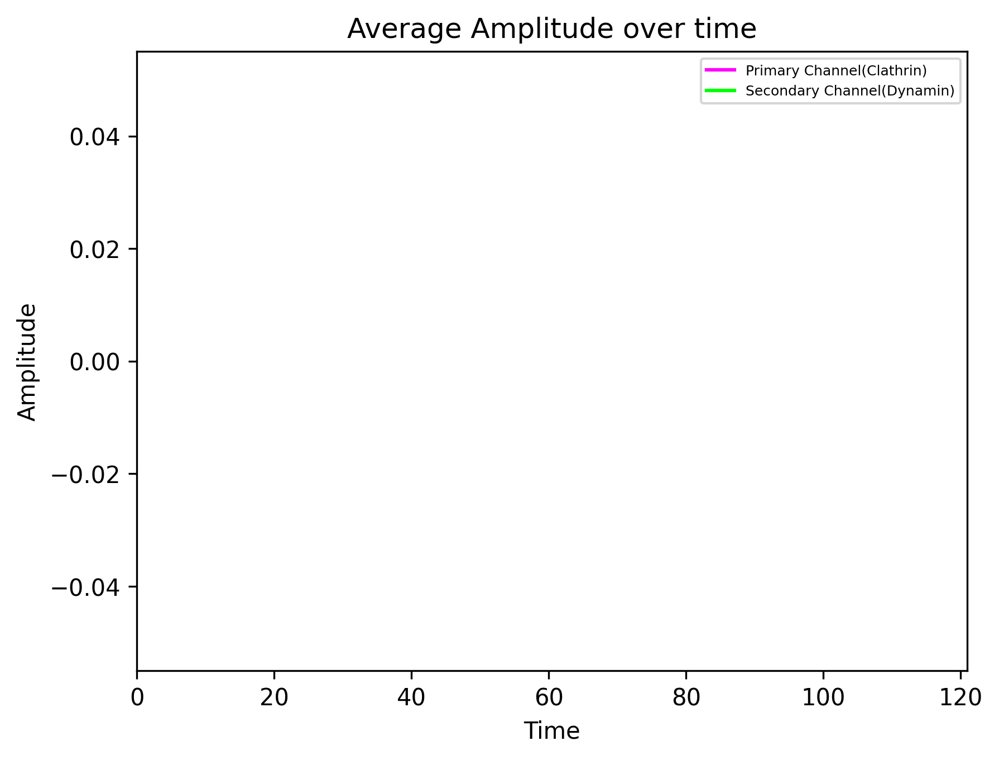

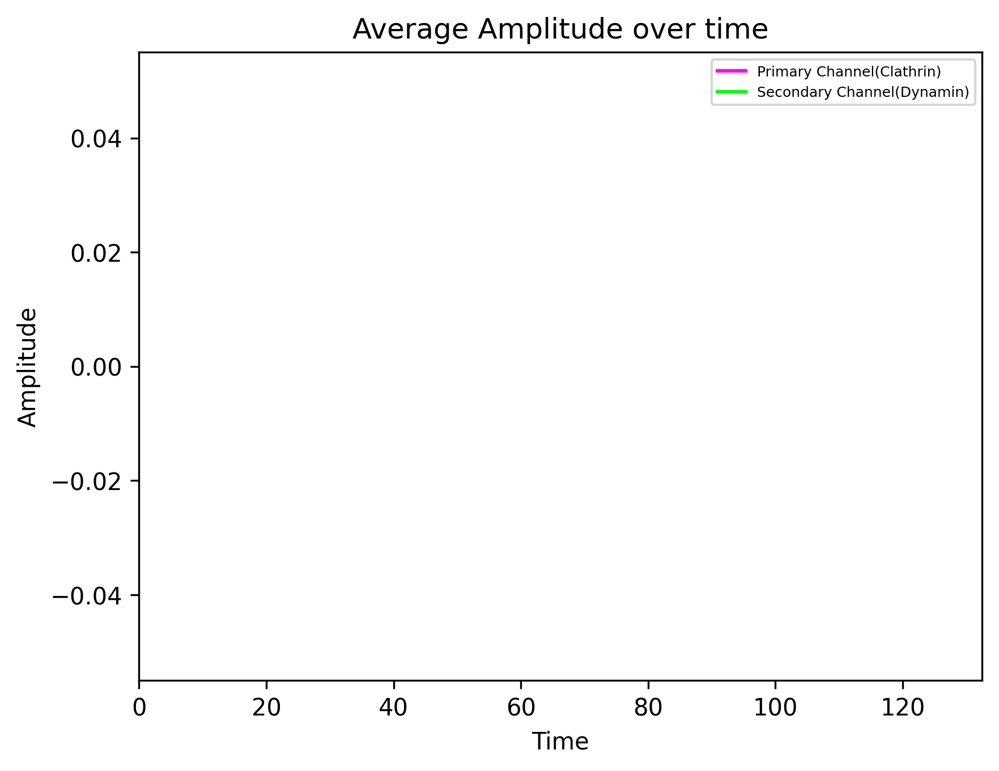

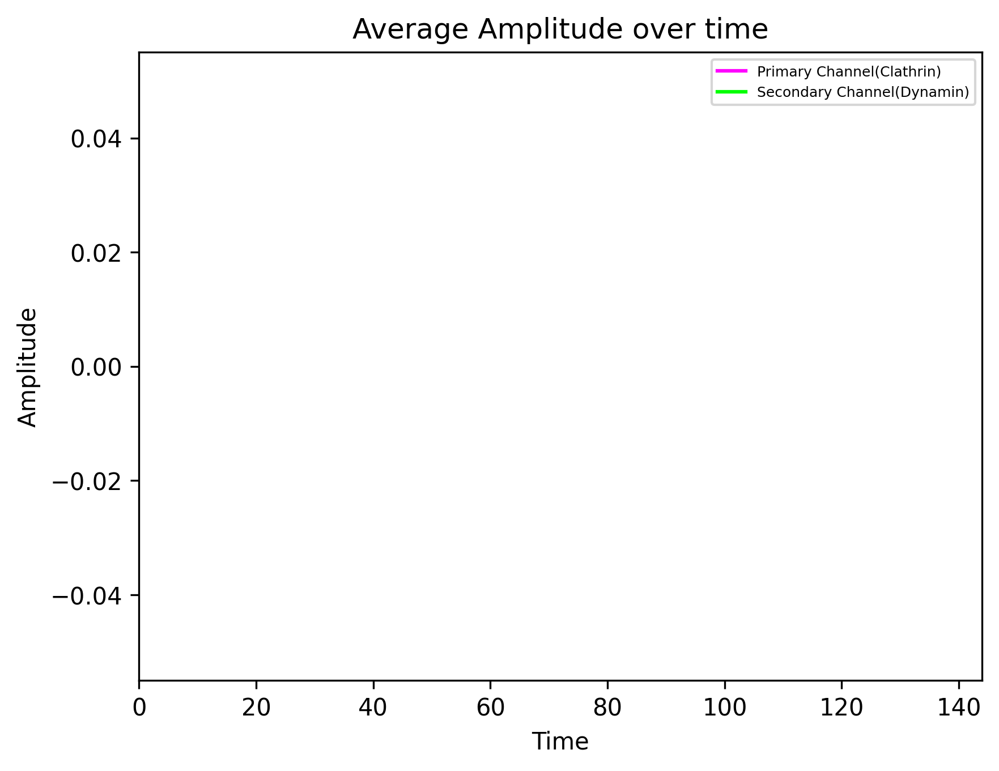

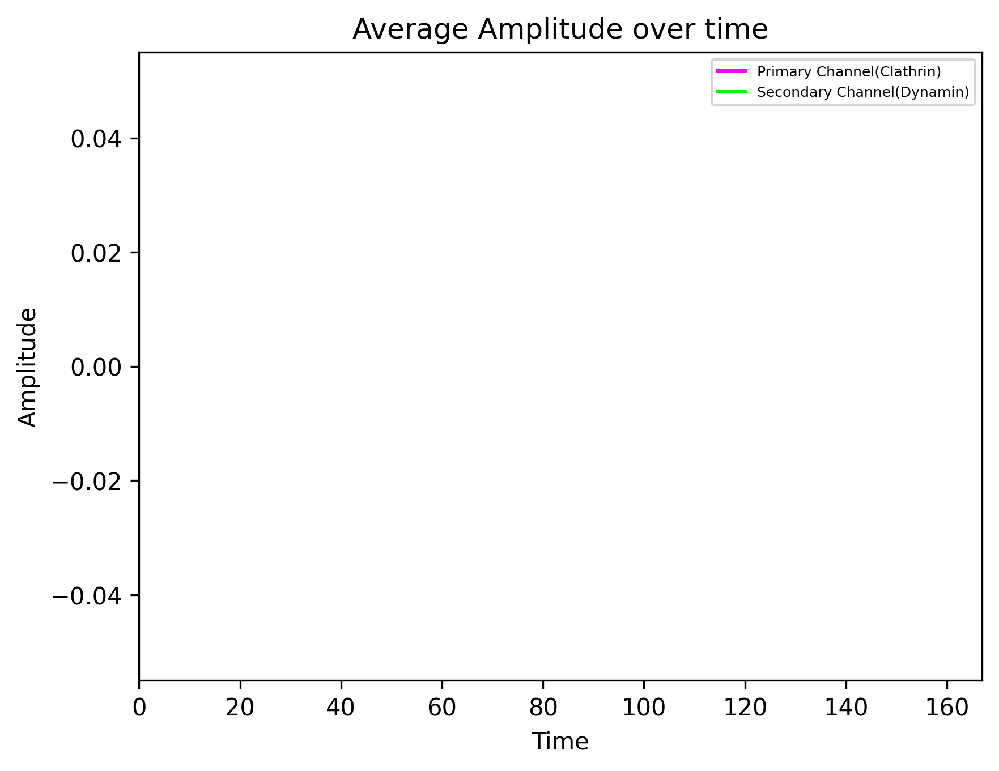

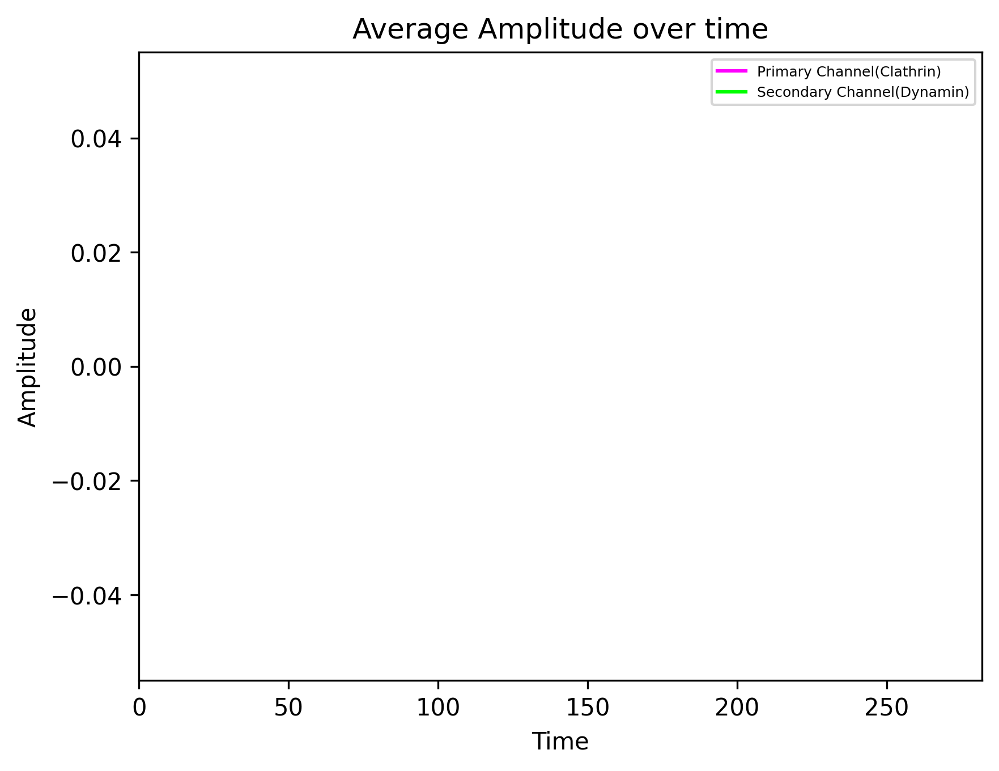

In [21]:
for n, cohort in enumerate(custom_length_ranges):
    primary_buffer, secondary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
    listOfTrackIdsAssignedToCohort = track_id_arrays[n], backgroundIntensity = [160,240], 
    # intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id')
    intensity_to_plot = ['c3_gaussian_amp','c2_gaussian_amp'], track_id_col_name = 'track_id')

    cumulative_plots(buffers = [primary_buffer, secondary_buffer],
    background_intensity= [160,240], time_shift = 50+cohort[1], framerate_msec = 2.3*1000, colors = ['magenta', 'lime'], 
                    legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Dynamin)'])
    plt.xlim(0, 75+cohort[1]*framerate_msec/1000)


In [136]:
# #  visualize the track alignment
# plt.figure(dpi=300)
# plt.title('clathrin')
# plt.imshow(primary_buffer)

# plt.figure(dpi=300)
# plt.title('dynamin')
# plt.imshow(secondary_buffer)

# Category 2 
## Actin and Clathrin Positive

In [139]:
cat2_df = filtered_tracks[filtered_tracks['channel1_positive'] == True]
track_id_arrays = filter_track_ids_by_length_ranges(dataframe = cat2_df, track_length_buckets = custom_length_ranges, 
                                 track_id_col_name = 'track_id', track_length_col_name = 'track_length')
print(f'number of tracks between [5,10] frames long are {len(track_id_arrays[0])}')
print(f'number of tracks between [11,15] frames long are {len(track_id_arrays[1])}')
print(f'number of tracks between [16,20] frames long are {len(track_id_arrays[2])}')
print(f'number of tracks between [21,25] frames long are {len(track_id_arrays[3])}')
print(f'number of tracks between [26,30] frames long are {len(track_id_arrays[4])}')
print(f'number of tracks between [31,40] frames long are {len(track_id_arrays[5])}')
print(f'number of tracks between [41,90] frames long are {len(track_id_arrays[6])}')

number of tracks between [5,10] frames long are 62
number of tracks between [11,15] frames long are 68
number of tracks between [16,20] frames long are 48
number of tracks between [21,25] frames long are 32
number of tracks between [26,30] frames long are 7
number of tracks between [31,40] frames long are 20
number of tracks between [41,90] frames long are 9


### The following function selects random track ids of a desired length 

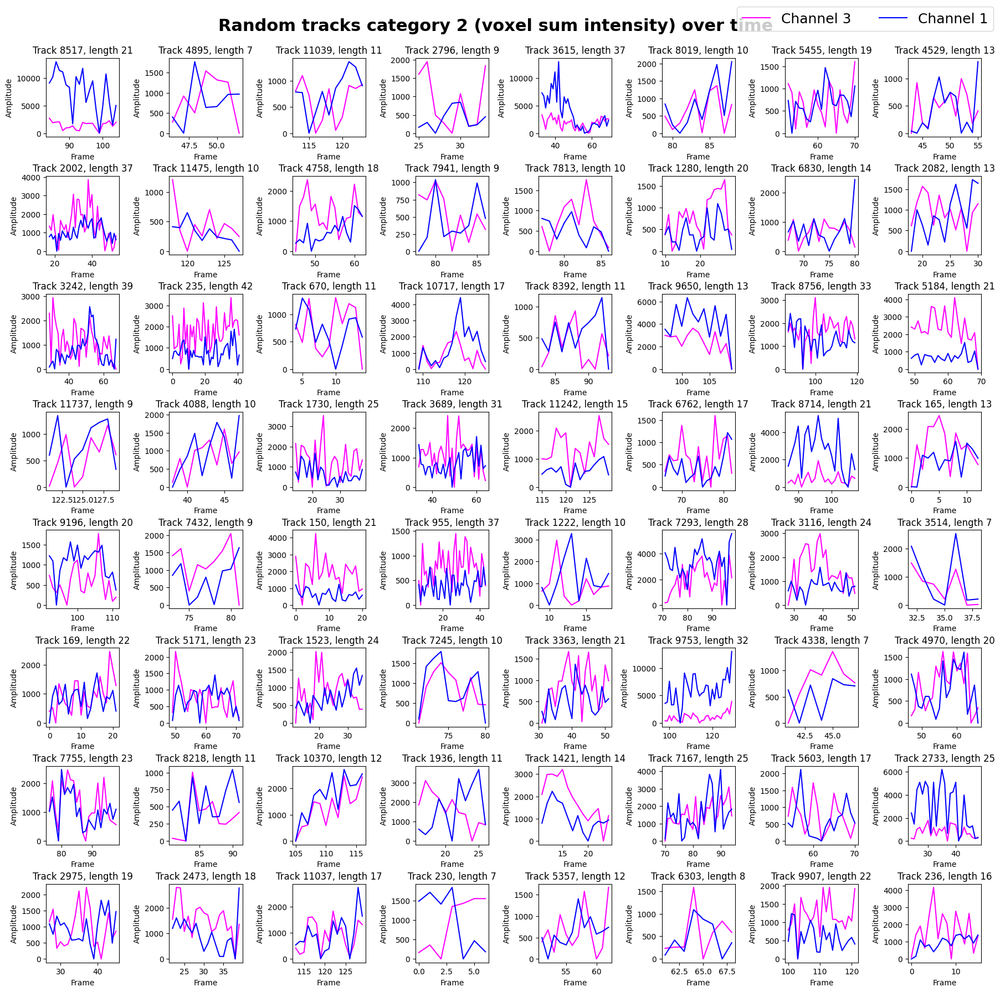

In [140]:
# Plot random tracks
random_tracks = random_track_ids(dataframe = cat2_df, desired_length = [0, np.inf], 
                                 track_length_col_name = 'track_length', track_id_col_name = 'track_id', 
                                num_to_select = 64)

intensity_time_plot(dataframe = track_df, tracks_to_plot = random_tracks, 
intensity_to_plot = ['c3_voxel_sum_adjusted','c1_voxel_sum_adjusted'], track_id_col_name = 'track_id', 
frame_col_name = 'frame', channels_to_plot = 2, legend_values = ['Channel 3', 'Channel 1'],
line_colors = ['magenta', 'blue'], graph_title = 'Random tracks category 2 (voxel sum intensity)')    

# The following function creates a buffer to align tracks by their peak value 

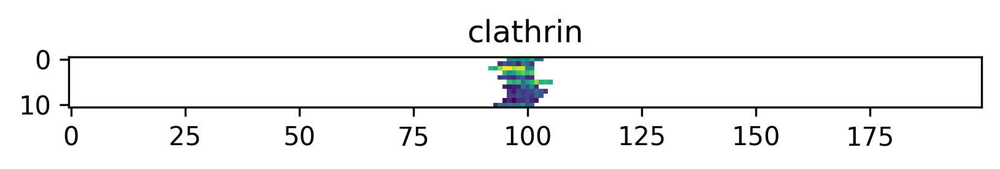

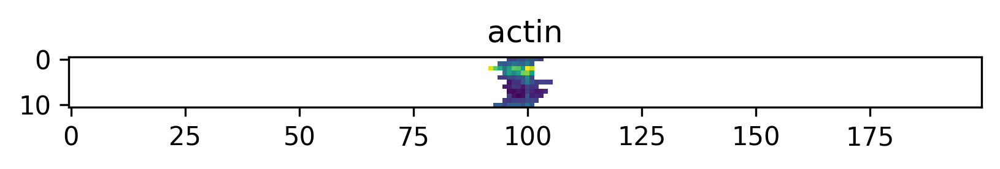

In [16]:
# primary_buffer, secondary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
# listOfTrackIdsAssignedToCohort = track_id_arrays[0], backgroundIntensity = [170,240], 
# intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')
# plt.figure(dpi=300)
# plt.title('clathrin')
# plt.imshow(primary_buffer)
# plt.figure(dpi=300)
# plt.title('actin')
# plt.imshow(secondary_buffer)

## Initial Cohort Plots for 2 Channels(Clathrin and Actin) only

In [ ]:
for n, cohort in enumerate(custom_length_ranges):
    primary_buffer, secondary_buffer = createBufferForLifetimeCohort(dataframe = track_df ,
    listOfTrackIdsAssignedToCohort = track_id_arrays[n], backgroundIntensity = [170, 240], 
    # intensity_to_plot = ['c3_voxel_sum_adjusted','c2_voxel_sum_adjusted', 'c1_voxel_sum_adjusted'], track_id_col_name = 'track_id')
    intensity_to_plot = ['c3_gaussian_amp', 'c1_gaussian_amp'], track_id_col_name = 'track_id')

    cumulative_plots(buffers = [primary_buffer, secondary_buffer],
    background_intensity= [170,160], time_shift = 50+cohort[1], framerate_msec = 2.3*1000, colors = ['magenta', 'lime'], 
                    legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Dynamin)'])
    plt.xlim(0, 75+cohort[1]*framerate_msec/1000)


**Length between 5 to 10 frames**

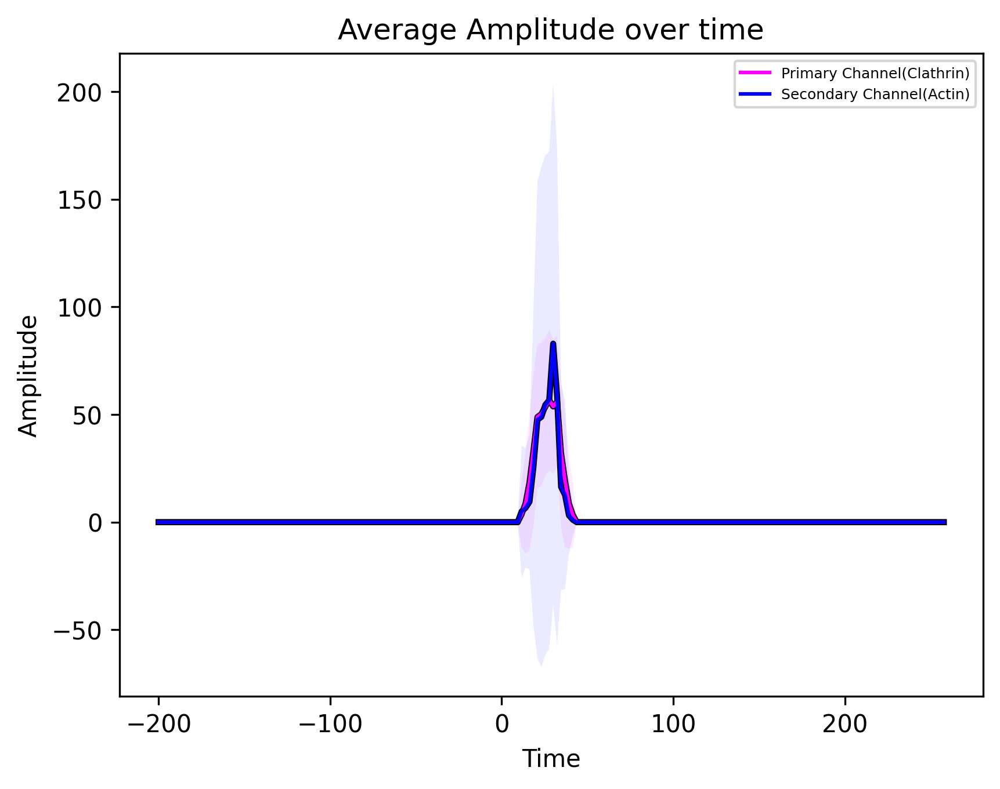

In [35]:
primary_buffer, secondary_buffer= createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[0], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer],
background_intensity= [170,240], time_shift = 30, framerate_msec = 2.3*1000, colors = ['magenta', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Actin)'])

**Length between 11 to 15 frames**

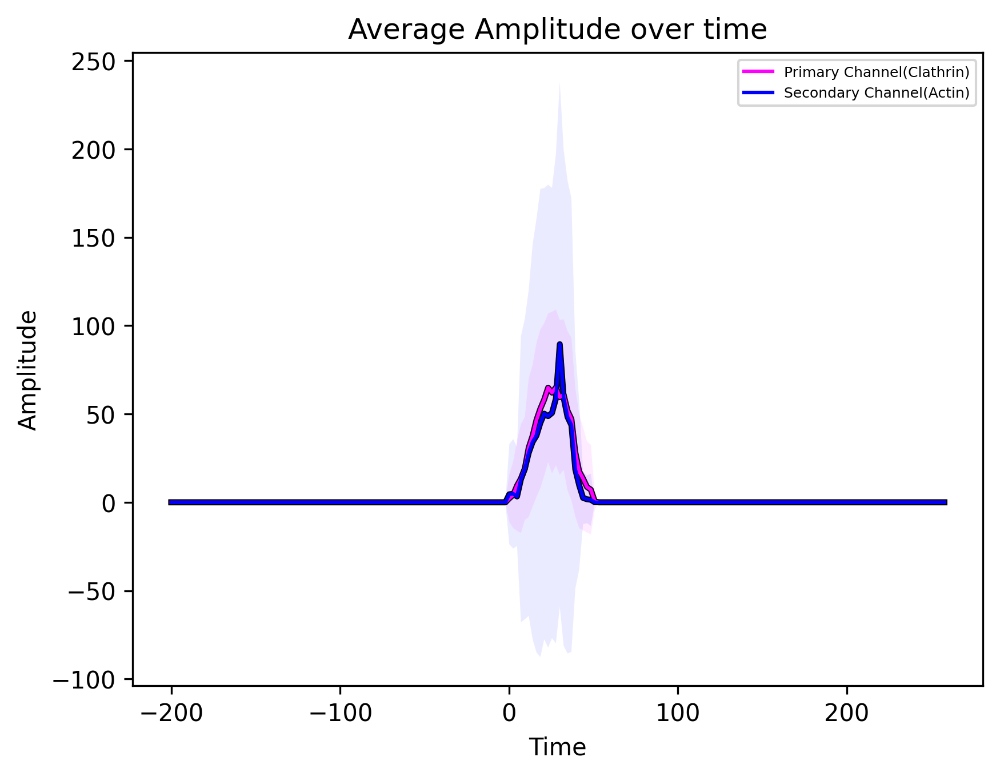

In [36]:
primary_buffer, secondary_buffer= createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[1], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer],
background_intensity= [170,240], time_shift = 30, framerate_msec = 2.3*1000, colors = ['magenta', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Actin)'])

**Length between 16 to 20 frames**

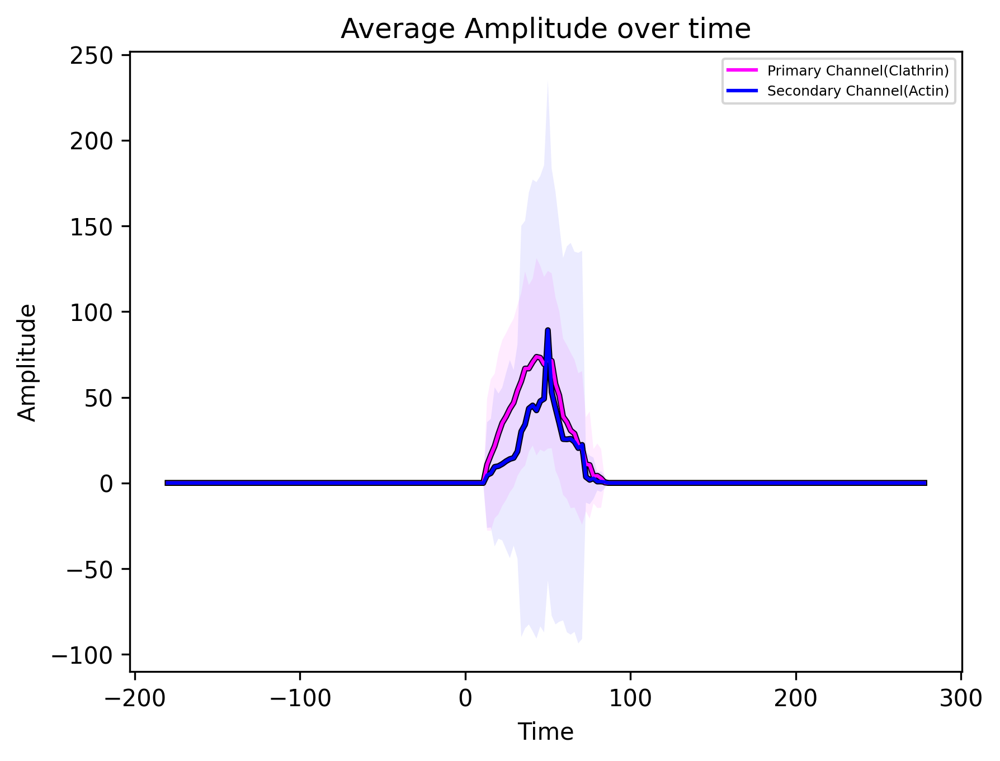

In [37]:
primary_buffer, secondary_buffer= createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[2], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer],
background_intensity= [170,240], time_shift = 50, framerate_msec = 2.3*1000, colors = ['magenta', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Actin)'])

**Length between 21 to 25 frames**

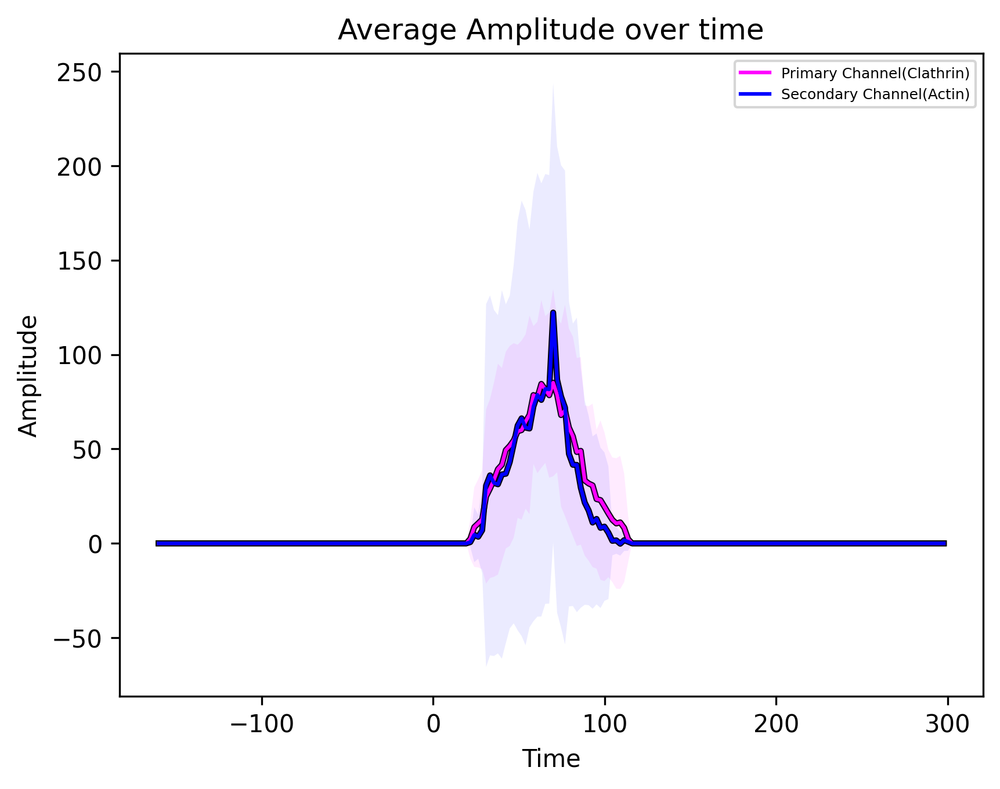

In [38]:
primary_buffer, secondary_buffer= createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[3], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer],
background_intensity= [170,240], time_shift = 70, framerate_msec = 2.3*1000, colors = ['magenta', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Actin)'])

**Length between 26 to 30 frames**

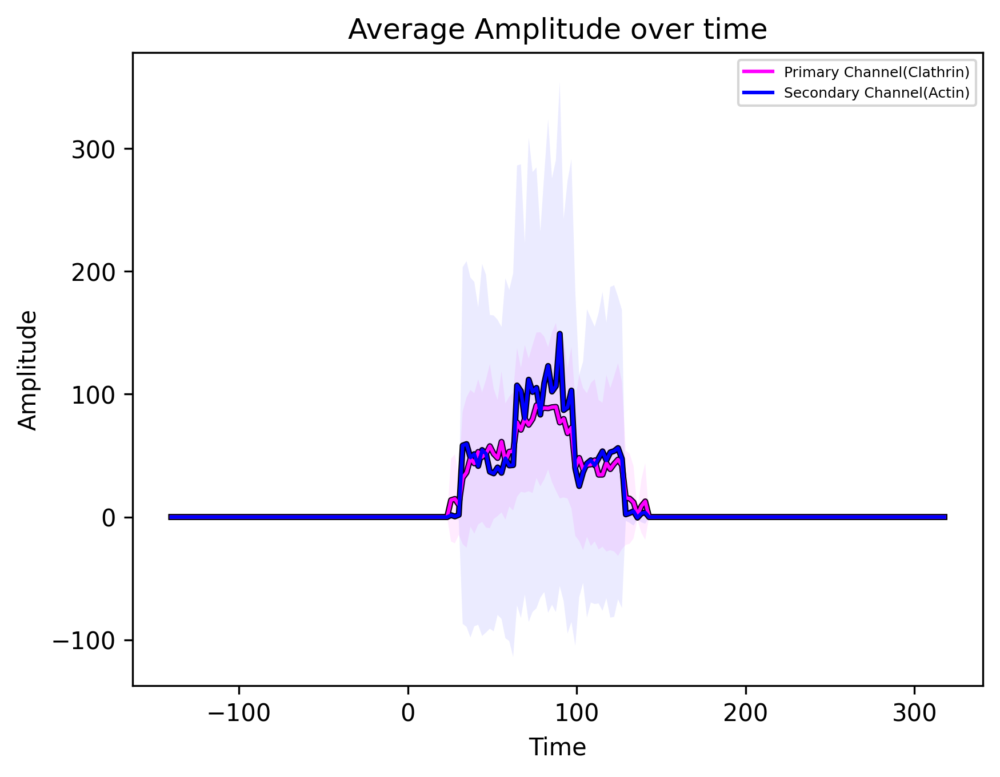

In [39]:
primary_buffer, secondary_buffer= createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[4], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer],
background_intensity= [170,240], time_shift = 90, framerate_msec = 2.3*1000, colors = ['magenta', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Actin)'])

**Length between 31 to 40 frames**

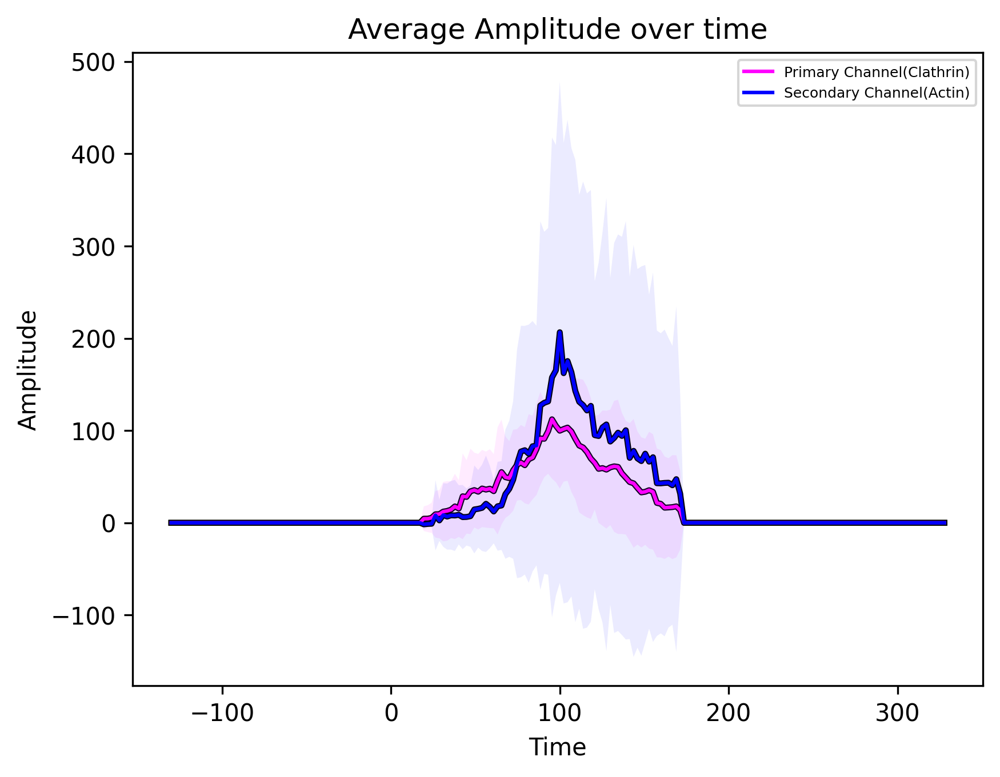

In [40]:
primary_buffer, secondary_buffer= createBufferForLifetimeCohort(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[5], backgroundIntensity = [170,240], 
intensity_to_plot = ['c3_gaussian_amp','c1_gaussian_amp'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer],
background_intensity= [170,240], time_shift = 100, framerate_msec = 2.3*1000, colors = ['magenta', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Actin)'])

## To test for normalized aggregated plots, change the following markdown files to code cells. 

primary_buffer, secondary_buffer, tertiary_buffer = createBufferForLifetimeCohort_normalized(dataframe = track_df ,
listOfTrackIdsAssignedToCohort = track_id_arrays[5], backgroundIntensity = [0,0,0], 
intensity_to_plot = ['amplitude','c2_peak', 'c1_peak'], track_id_col_name = 'track_id')

cumulative_plots(buffers = [primary_buffer, secondary_buffer, tertiary_buffer],
background_intensity= [0,0,0], time_shift = 100, framerate_msec = 2.3*1000, colors = ['magenta', 'lime', 'blue'], 
                 legend_vals = ['Primary Channel(Clathrin)', 'Secondary Channel(Dynamin)', 'Tertiary Channel(Actin)'])